# Commodity carry as a trading signal

This notebook serves as an illustration of the points discussed in the post ["Commodity carry as a trading signal"](https://research.macrosynergy.com/commodity-carry-as-a-trading-signal-part-1/) available on the Macrosynergy website. 

Commodity futures carry contains information on implicit subsidies, such as convenience yields and hedging premia. It becomes a valid trading signal when incorporating some adjustments for inflation, seasonal effects, and volatility. There has been strong evidence for predictive power of carry with respect to subsequent futures returns for a broad panel of 23 commodities from 2000 to 2023. Furthermore, stylized naïve PnLs based on carry signals point to material economic value, either on its own or whenever managing long commodity exposure. The predictive power and value generation of carry signals seems to be even stronger for relative cross-commodity trades. 

This notebook provides the essential code required to replicate the analysis discussed in the post.  

The notebook covers the three main parts:

- Get Packages and JPMaQS Data: This section is responsible for installing and importing the necessary Python packages that are used throughout the analysis. 

- Transformations and Checks: In this part, the notebook performs calculations and transformations on the data to derive the relevant signals and targets used for the analysis, including normalization of feature variables using z-score or building a simple linear composite indicator for commodities futures returns.

- Value Checks: This is the most critical section, where the notebook calculates and implements the trading strategies based on the hypotheses tested in the post. This section involves backtesting a few simple, but powerful trading strategies targeting. The primary focus is on three key propositions:

    - The viability of real commodity carry as a predictor for subsequent outright commodity futures returns.
    - The effectiveness of relative commodity carry in predicting subsequent global relative commodity futures returns.
    - The reliability of relative commodity carry as a predictor for subsequent intra-group relative commodity futures returns.

It's important to note that while the notebook covers a selection of indicators and strategies used for the post's main findings, there are countless other possible indicators and approaches that can be explored by users. Users can modify the code to test different hypotheses and strategies based on their own research and ideas. Best of luck with your research!

## Get packages and JPMaQS data

This notebook primarily relies on the standard packages available in the Python data science stack. However, there is an additional package `macrosynergy` that is required for two purposes:

- Downloading JPMaQS data: The `macrosynergy` package facilitates the retrieval of JPMaQS data, which is used in the notebook.

- For the analysis of quantamental data and value propositions: The `macrosynergy` package provides functionality for performing quick analyses of quantamental data and exploring value propositions.

For detailed information and a comprehensive understanding of the `macrosynergy` package and its functionalities, please refer to the [“Introduction to Macrosynergy package”](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php) notebook on the Macrosynergy Quantamental Academy or visit the following link on [Kaggle](https://www.kaggle.com/code/macrosynergy/introduction-to-macrosynergy-package).

In [1]:
# Uncomment below for new downloads or package updates
"""
%%capture
! pip install macrosynergy --upgrade"""

'\n%%capture\n! pip install macrosynergy --upgrade'

In [2]:
import numpy as np
import pandas as pd
from pandas import Timestamp
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
import os

import macrosynergy.management as msm
import macrosynergy.panel as msp
import macrosynergy.signal as mss
import macrosynergy.pnl as msn
from macrosynergy.download import JPMaQSDownload

warnings.simplefilter("ignore")

In [3]:
# Commodity cross-section lists

cids_nfm = ["GLD", "SIV", "PAL", "PLT"]
cids_fme = ["ALM", "CPR", "LED", "NIC", "TIN", "ZNC"]
cids_ene = ["BRT", "WTI", "NGS", "GSO", "HOL"]
cids_sta = ["COR", "WHT", "SOY", "CTN"]
cids_mis = ["CFE", "SGR", "NJO", "CLB"]

cids = cids_nfm + cids_fme + cids_ene + cids_sta + cids_mis

comm_groups = {
    "PRM": ["GLD", "SIV", "PAL", "PLT"],  # Precious metals
    "INM": ["ALM", "CPR", "LED", "NIC", "TIN", "ZNC"], # Industrial metals
    "ENE": ["BRT", "WTI", "NGS", "GSO", "HOL"],  # Energy
    "GRA": ["COR", "WHT", "SOY", "CTN"],  # Grains
    "SOF": ["CFE", "SGR", "NJO", "CLB"]
}

In [4]:
# Category tickers
main = [
    # nominal carry
    "COCRY_NSA", "COCRY_VT10", "COCRY_SA", "COCRY_SAVT10", 
    # real carry
    "COCRR_NSA", "COCRR_VT10", "COCRR_SA", "COCRR_SAVT10"
]
econ = []
mark = ["COXR_NSA", "COXR_VT10"]

xcats = main + econ + mark

# Resultant tickers

xtix = ["USD_EQXR_NSA", "GLB_DRBXR_NSA"]

tickers = [cid + "_" + xcat for cid in cids for xcat in xcats] + xtix
print(f"Maximum number of tickers is {len(tickers)}")

Maximum number of tickers is 232


The description of each JPMaQS category is available under [Macro quantamental academy](https://academy.macrosynergy.com/quantamental-indicators/), or [JPMorgan Markets](https://markets.jpmorgan.com/#jpmaqs) (password protected). For tickers used in this notebook see [Commodity future carry](https://academy.macrosynergy.com/academy/Themes/Stylized%20trading%20factors/_build/html/notebooks/Commodity%20future%20carry.php),  [Commodity future returns](https://academy.macrosynergy.com/academy/Themes/Generic%20returns/_build/html/notebooks/Commodity%20future%20returns.php), [Equity index future returns (USD)](https://academy.macrosynergy.com/academy/Themes/Generic%20returns/_build/html/notebooks/Equity%20index%20future%20returns.php), and [The global directional risk basket (GLB)](https://academy.macrosynergy.com/academy/Themes/Generic%20returns/_build/html/notebooks/Directional%20risk%20basket%20returns.php).

In [5]:
# Download series from J.P. Morgan DataQuery by tickers

start_date = "1995-01-01"

# Retrieve credentials

client_id: str = os.getenv("DQ_CLIENT_ID")
client_secret: str = os.getenv("DQ_CLIENT_SECRET")

# Download from DataQuery

with JPMaQSDownload(client_id=client_id, client_secret=client_secret) as downloader:
    dfd = downloader.download(
        tickers=tickers,
        start_date=start_date,
        metrics=["value",],
        suppress_warning=True,
        show_progress=True,
    )

Timestamp UTC:  2024-03-21 12:58:08
Connection successful!


Requesting data: 100%|██████████| 12/12 [00:02<00:00,  4.93it/s]


Some dates are missing from the downloaded data. 
3 out of 7626 dates are missing.


In [6]:
dfx = dfd.copy().sort_values(["cid", "xcat", "real_date"])
dfx.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1574676 entries, 158531 to 1574675
Data columns (total 4 columns):
 #   Column     Non-Null Count    Dtype         
---  ------     --------------    -----         
 0   real_date  1574676 non-null  datetime64[ns]
 1   cid        1574676 non-null  object        
 2   xcat       1574676 non-null  object        
 3   value      1574676 non-null  float64       
dtypes: datetime64[ns](1), float64(1), object(2)
memory usage: 60.1+ MB


### Availability

It is important to assess data availability before conducting any analysis. It allows to identify any potential gaps or limitations in the dataset, which can impact the validity and reliability of analysis and ensure that a sufficient number of observations for each selected category and cross-section is available as well as determining the appropriate time periods for analysis.

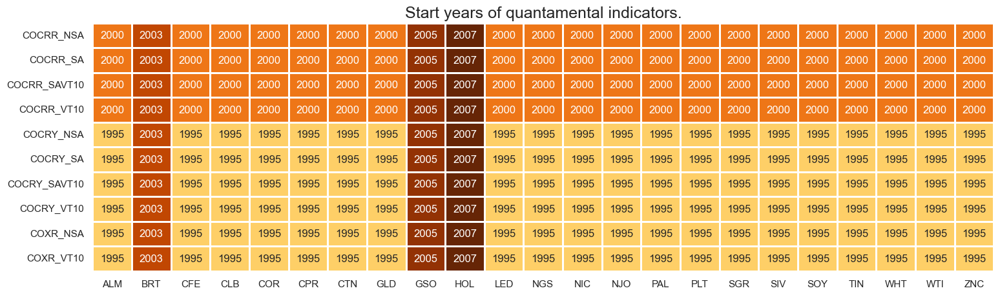

In [7]:
msm.check_availability(dfx, xcats=xcats, cids=cids, missing_recent=False)

## Transformation and checks

### Features

#### Nominal carry

Futures carry displays extreme differences in variation across commodities. Natural gas, gasoline, and soy display large volatility, whereas easily storable precious metals, particularly palladium, gold, and silver, show very low variation. Here, we are displaying [`COCRY_NSA`](https://academy.macrosynergy.com/academy/Themes/Stylized%20trading%20factors/_build/html/notebooks/Commodity%20future%20carry.php#nominal-commodity-future-carry), Nominal commodity future carry. This indicator comes straight from JPMaQS and does not require any transformations. Convenient function [`.view_ranges()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#visualize-panel-distributions-with-view-ranges) displays a barplot with historical means and standard deviations of the indicator from the chosen date (2000)

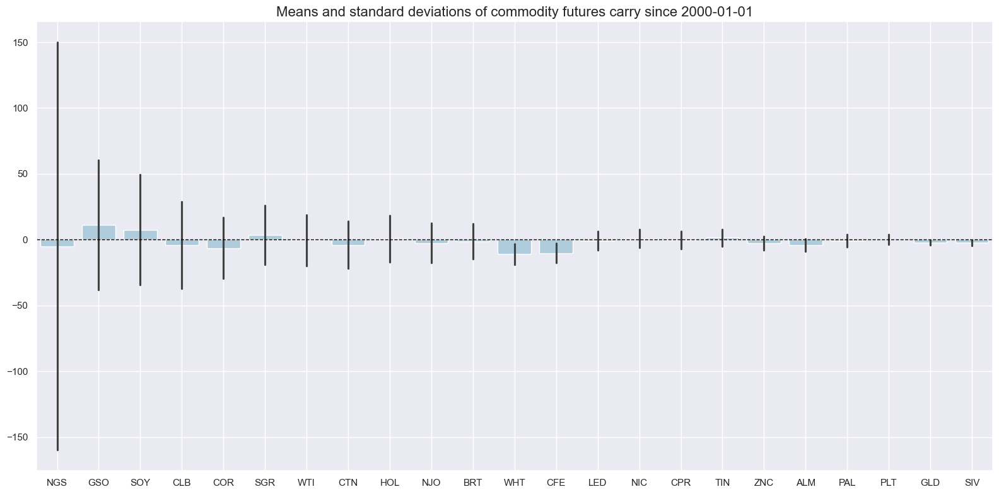

In [8]:
xcatx = ["COCRY_NSA"]
sdate = "2000-01-01"

msp.view_ranges(
    dfx,
    cids=cids,
    xcats=xcatx,
    kind="bar",
    sort_cids_by="std",
    title=f"Means and standard deviations of commodity futures carry since {sdate}",
    start=sdate,
    legend_bbox_to_anchor=(1, 1)
)

Below are the actual means of futures carry across the panel of 25 commodities and the mean across all values:

In [9]:
filt =( dfx["xcat"] == "COCRY_NSA") & (dfx['real_date'] > "2000-01-01")
dfw = (
    dfx[filt]
    .pivot_table(index="real_date", columns="cid", values="value")
    .replace(0, np.nan)
)
display(dfw.mean().sort_values(ascending=False))
display(dfw.mean().mean())


cid
GSO    11.076610
SOY     7.517636
SGR     3.568312
TIN     1.603071
NIC     0.833597
HOL     0.665130
PLT     0.177149
CPR    -0.318347
WTI    -0.393550
PAL    -0.935151
LED    -0.987825
BRT    -1.372177
GLD    -2.320359
SIV    -2.482233
ZNC    -2.587650
NJO    -2.648748
CTN    -4.113172
CLB    -4.122368
ALM    -4.154135
NGS    -4.954269
COR    -6.373901
CFE   -10.225343
WHT   -11.093605
dtype: float64

-1.4626664769309723

#### Real carry

The line plot below shows the development of nominal and real carry across all 25 commodities with the help of customized function [`view_timelines()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#visualize-panel-time-series-with-view-timelines) from the `macrosynergy` package. The differences between real and nominal measures are mostly minor but notable for commodities with low carry variance. Conveniently, the Real commodity future carry indicator [`"COCRR_NSA"`](https://academy.macrosynergy.com/academy/Themes/Stylized%20trading%20factors/_build/html/notebooks/Commodity%20future%20carry.php#real-commodity-future-carry) is also directly obtainable from JPMaQS alongside nominal version ["COCRY_NSA"](https://academy.macrosynergy.com/academy/Themes/Stylized%20trading%20factors/_build/html/notebooks/Commodity%20future%20carry.php#nominal-commodity-future-carry)

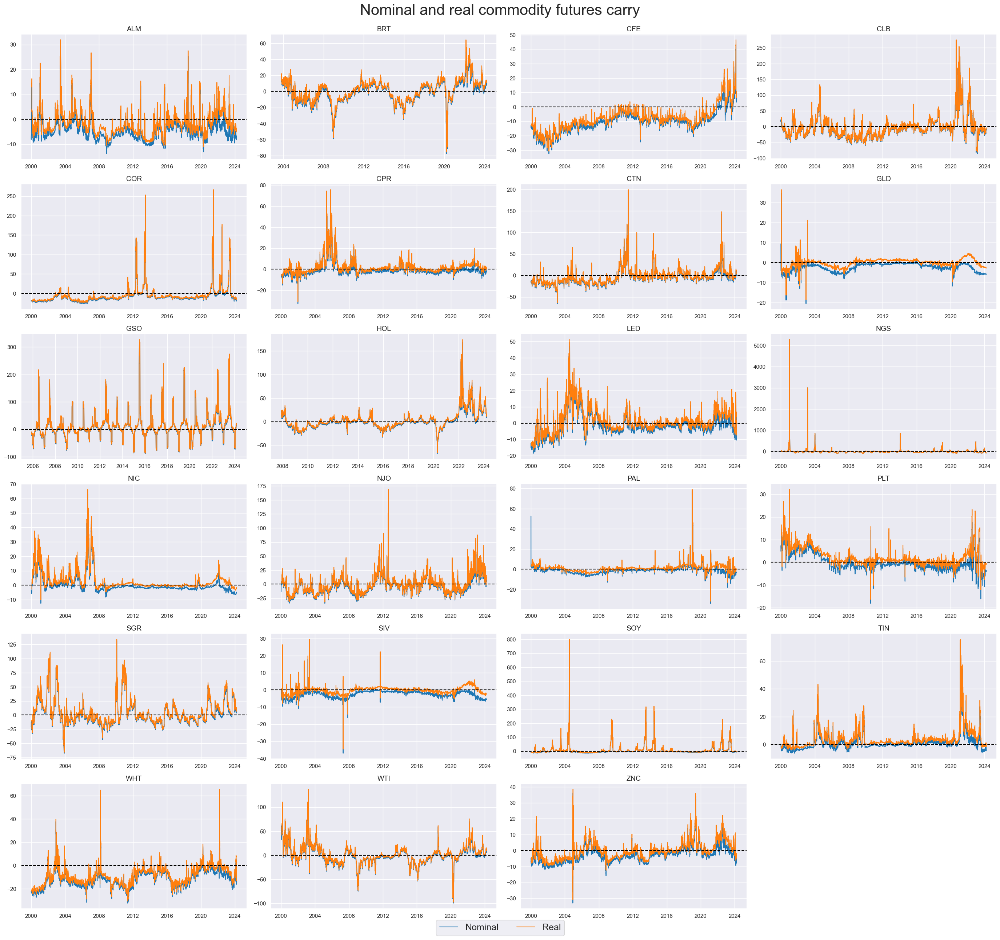

In [10]:
xcatx = ["COCRY_NSA", "COCRR_NSA"]

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cids,
    ncol=4,
    cumsum=False,
    start=sdate,
    same_y=False,
    all_xticks=True,
    title="Nominal and real commodity futures carry",
    title_fontsize=30,
    xcat_labels=["Nominal", "Real"],
    legend_fontsize=18,
    )

Inflation adjustment pushes the average panel carry since 2000 from negative to positive territory:

In [11]:
filt =( dfx["xcat"] == "COCRR_NSA") & (dfx['real_date'] > "2000-01-01")
dfw = (
    dfx[filt]
    .pivot_table(index="real_date", columns="cid", values="value")
    .replace(0, np.nan)
)
dfw.mean().mean()

0.8176231139133816

Commodity future carry is not highly correlated across markets, and hence, carry-based positions should tend to be more diversified. Below is a correlation matrix showing a rather weak correlation across most commodities with very few exceptions (such as between WTI and BRT). The [`correl_matrix()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#visualize-relations-across-sections-or-categories-with-correl-matrix) function from `macrosynergy` package visualizes Pearson correlation between commodity futures carry across different commodities:

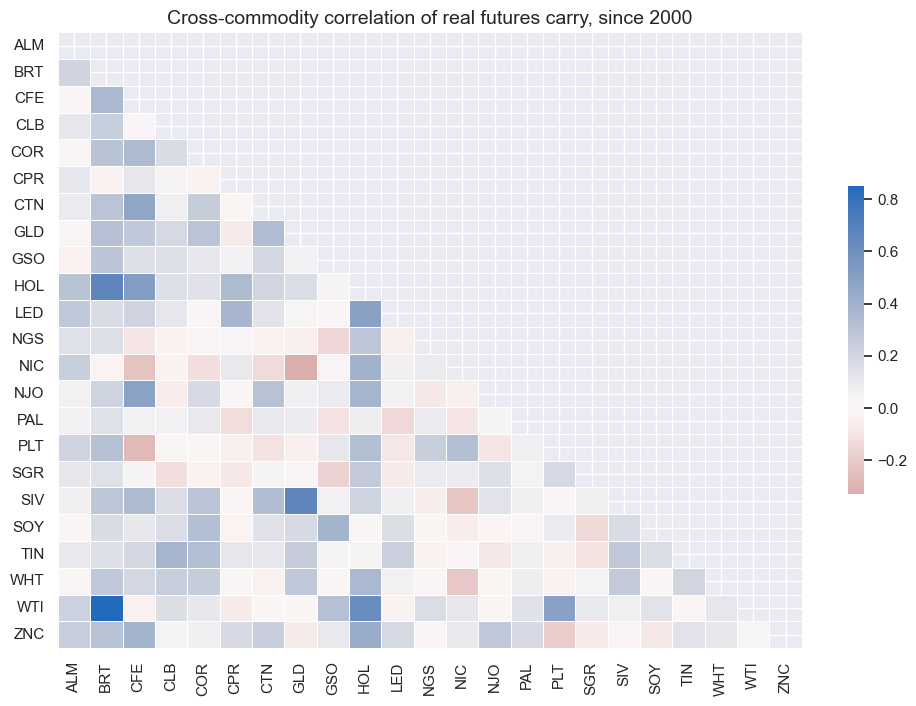

In [12]:
msp.correl_matrix(
    dfx,
    xcats="COCRR_NSA",
    cids=cids,
    title="Cross-commodity correlation of real futures carry, since 2000",
    size=(12, 8),
    start=sdate,
    cluster=False
)

#### Volatility-adjusted carry

 The average daily return standard deviations of natural gas futures are roughly three times as large as those of gold. To mitigate this heteroscedasticity, one can calculate “volatility-targeted carry.” JPMaQS calculates such carry based on positions that are scaled to a 10% vol target based on a historical standard deviation of the commodity future returns for an exponential moving average with a half-life of 11 days. Positions are rebalanced at the end of each month. Conveniently the volatility adjusted carry is also available from JPMaQS [`COCRR_VT10`](https://academy.macrosynergy.com/academy/Themes/Stylized%20trading%20factors/_build/html/notebooks/Commodity%20future%20carry.php#real-commodity-future-carry). As before, [`.view_ranges()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#visualize-panel-distributions-with-view-ranges) displays a barplot with historical means and standard deviations of the indicator from the chosen date (2000)

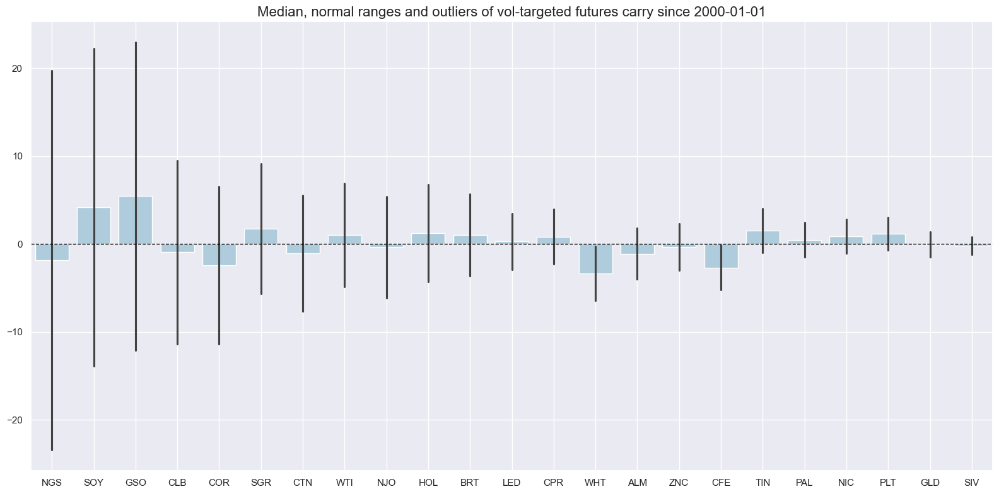

In [13]:
xcatx = ["COCRR_VT10"]

msp.view_ranges(
    dfx,
    cids=cids,
    xcats=xcatx,
    kind="bar",
    sort_cids_by="std",
    title=f"Median, normal ranges and outliers of vol-targeted futures carry since {sdate}",
    start=sdate,
    legend_bbox_to_anchor=(1, 1)
)

Volatility targeted real futures carry are displayed for comparison with the help of customized function [`view_timelines()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#visualize-panel-time-series-with-view-timelines) from the `macrosynergy` package:

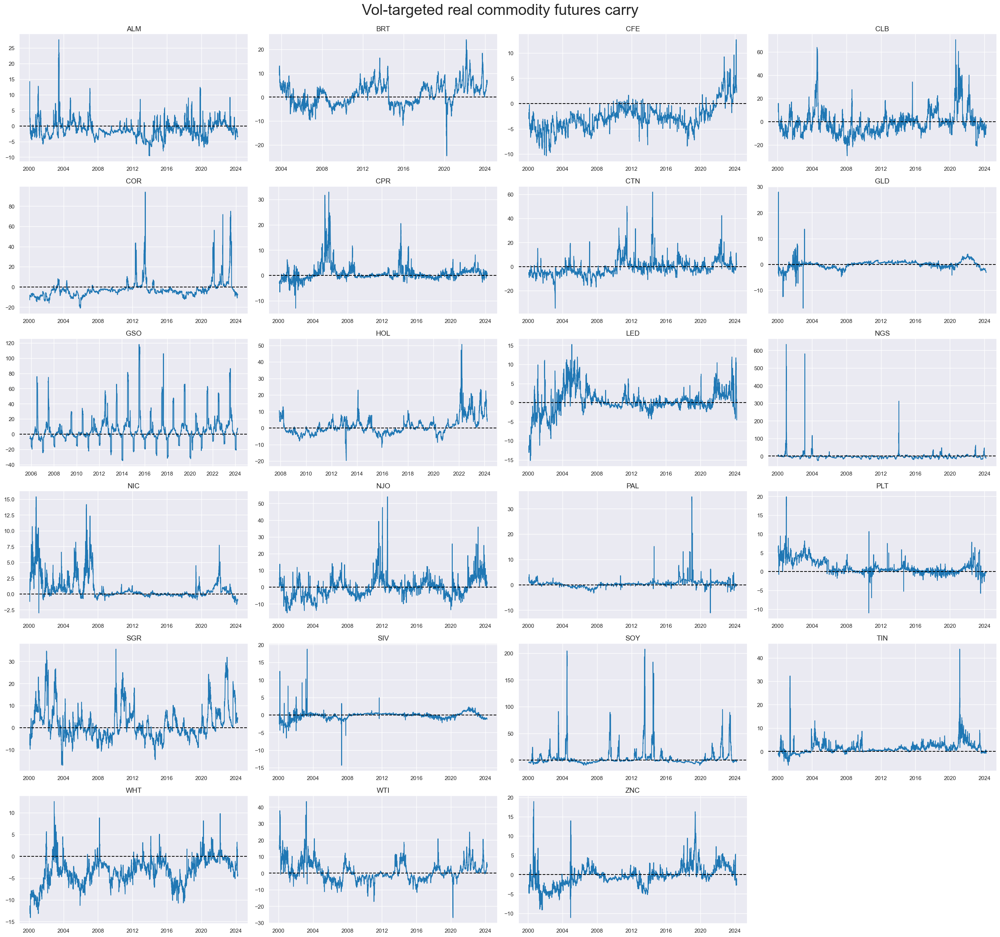

In [14]:
xcatx = ["COCRR_VT10",]

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cids,
    ncol=4,
    cumsum=False,
    start=sdate,
    same_y=False,
    all_xticks=True,
    title="Vol-targeted real commodity futures carry",
    title_fontsize=30,
    legend_fontsize=18,
    )

#### Seasonally adjusted carry

Here, we display side-by-side non-seasonally adjusted real carry [`COCRR_NSA`](https://academy.macrosynergy.com/academy/Themes/Stylized%20trading%20factors/_build/html/notebooks/Commodity%20future%20carry.php#real-commodity-future-carry) with seasonally adjusted version [`COCRR_SA`](https://academy.macrosynergy.com/academy/Themes/Stylized%20trading%20factors/_build/html/notebooks/Commodity%20future%20carry.php#real-seasonally-adjusted-commodity-future-carry), which also comes straight from JPMaQS and does not require any transformation. As before, the customized function [`view_timelines()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#visualize-panel-time-series-with-view-timelines) from the `macrosynergy` package proves handy for side by side comparison of both indicators: 

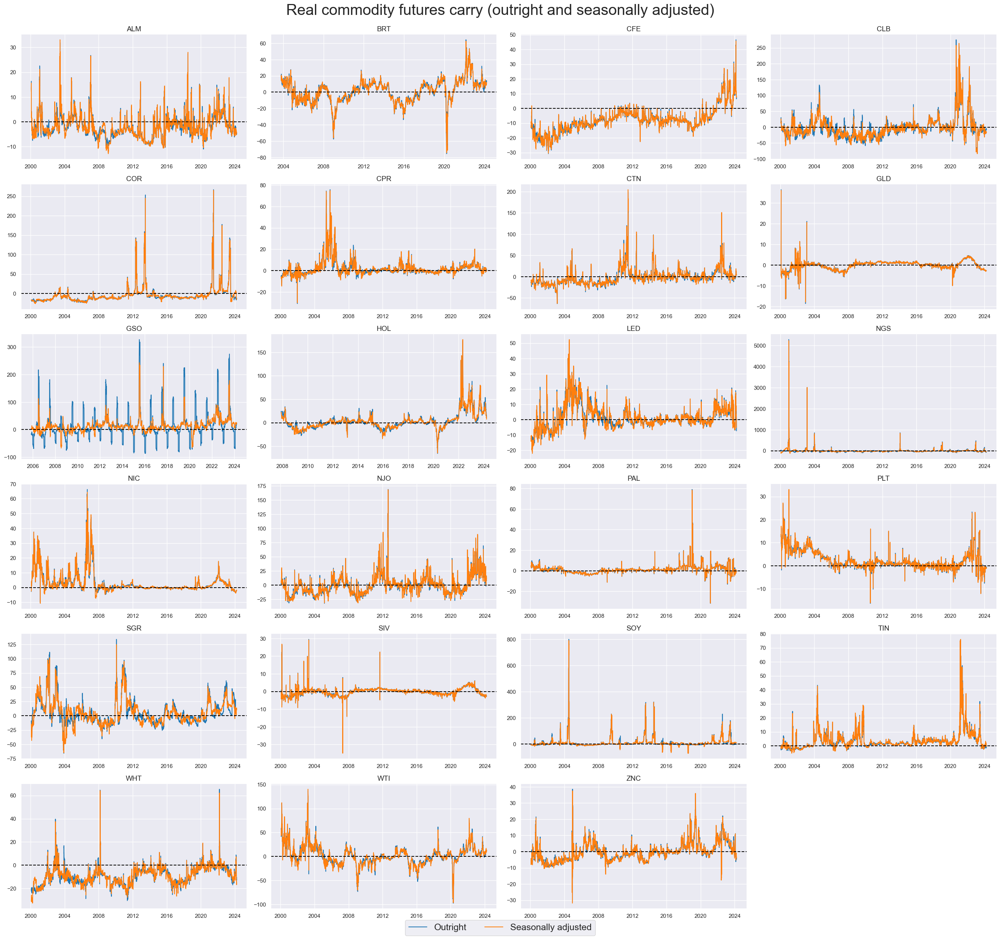

In [15]:
xcatx = ["COCRR_NSA", "COCRR_SA"]

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cids,
    ncol=4,
    cumsum=False,
    start=sdate,
    same_y=False,
    all_xticks=True,
    title="Real commodity futures carry (outright and seasonally adjusted)",
    title_fontsize=30,
    xcat_labels=["Outright", "Seasonally adjusted"],
    legend_fontsize=18,
    )


To display real-time estimated seasonal factors, we display the difference between seasonally adjusted and non-adjusted carry.

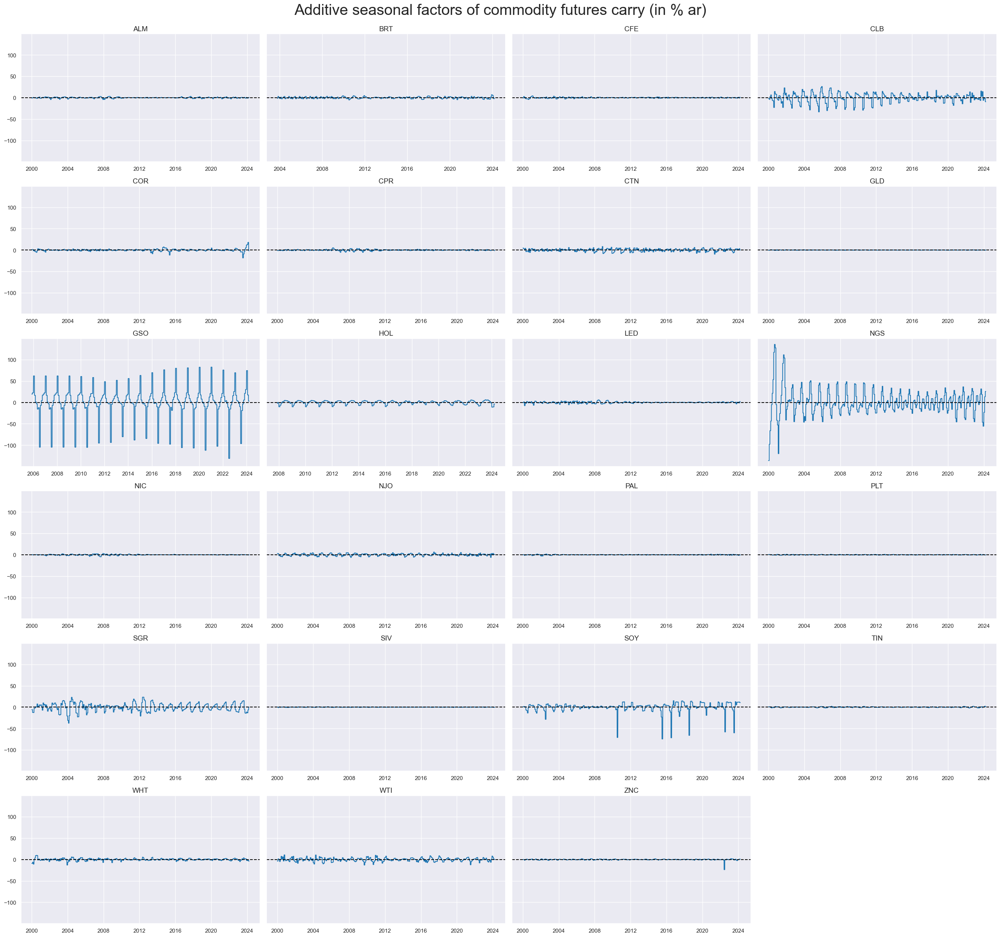

In [16]:

calcs = ["COCRY_ASF = COCRY_SA - COCRY_NSA",]
dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cids)
dfx = msm.update_df(dfx, dfa)

msp.view_timelines(
    dfx,
    xcats="COCRY_ASF",
    cids=cids,
    ncol=4,
    cumsum=False,
    start=sdate,
    same_y=True,
    all_xticks=True,
    title="Additive seasonal factors of commodity futures carry (in % ar)",
    title_fontsize=30,
    legend_fontsize=18,
    )

#### Normalized carry

Normalizing values across different categories is a common practice in macroeconomics. This is particularly important when summing or averaging categories with different units and time series properties. Using `macrosynergy's` custom function [`make_zn_scores()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#normalize-panels-with-make-zn-scores) we normalize the selected scores around neutral value (zero), using only past information. Re-estimation is done on monthly basis, and we use a minimum of 3 years data. We protect against outliers using 3 standard deviations as the threshold. The normalized indicators receive postfix `_ZNI`. Using `pan_weight=0`, we use a particular cross-section, not the whole panel, for scaling. 

In [17]:
crrs = ["COCRR_NSA", "COCRR_VT10", "COCRR_SA", "COCRR_SAVT10"]
xcatx = crrs

dfa = pd.DataFrame(columns=list(dfx.columns))
for xc in xcatx:
    dfaa = msp.make_zn_scores(
        dfx,
        xcat=xc,
        cids=cids,
        sequential=True,
        min_obs=261 * 3,  # minimum requirement is 3 years of daily data
        neutral="zero", 
        pan_weight=0,
        thresh=3,
        postfix="_ZNI",
        est_freq="m",
    )
    dfa = msm.update_df(dfa, dfaa)

dfx = msm.update_df(dfx, dfa)

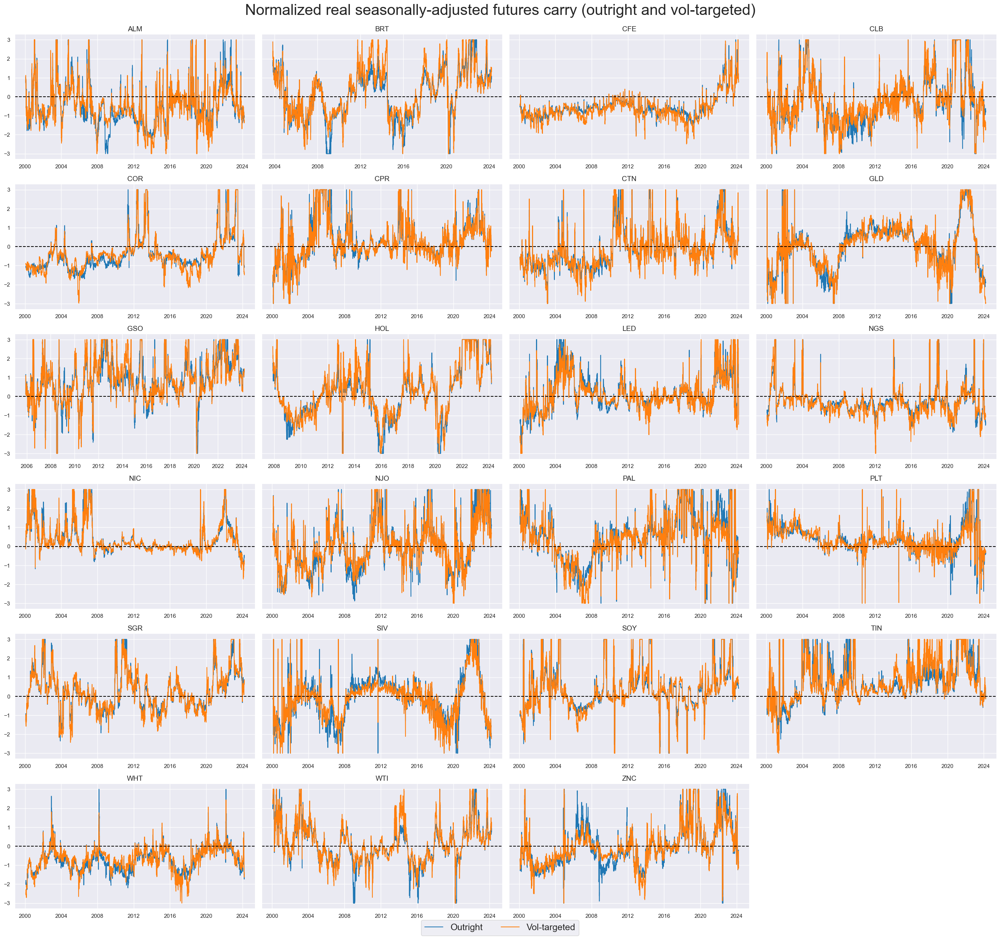

In [18]:
xcatx = ["COCRR_SA_ZNI", "COCRR_SAVT10_ZNI"]

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cids,
    ncol=4,
    cumsum=False,
    start=sdate,
    same_y=True,
    all_xticks=True,
    title="Normalized real seasonally-adjusted futures carry (outright and vol-targeted)",
    title_fontsize=30,
    xcat_labels=["Outright", "Vol-targeted"],
    legend_fontsize=18,
    )

#### Relative carry metrics

For the second hypothesis tested in this notebook (The effectiveness of relative commodity carry in predicting subsequent global relative commodity futures returns), we build global relative values of vol-targeted carry. The [`make_relative_value()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#compute-panels-versus-basket-with-make-relative-value) function generates a data frame of relative values for a given list of categories. In this case, “relative” means that the original value is compared to a basket average. By default, the basket consists of all available cross-sections, and the relative value is calculated by subtracting the basket average from individual cross-section values. Here, we calculate relative vol-targeted adjusted and non-adjusted futures commodity real carry. The new time series receives postfix `vGCO` (versus Global Commodities).

In [19]:
xcatx= ['COCRR_VT10_ZNI', 'COCRR_SAVT10_ZNI', 'COCRR_VT10', 'COCRR_SAVT10']

dfa = msp.make_relative_value(
    dfx,
    xcats=xcatx,
    cids=cids,
    blacklist=None,
    rel_meth="subtract",
    rel_xcats=None,
    postfix="vGCO",
)

dfx = msm.update_df(dfx, dfa)

For the third hypothesis tested in this notebook (the reliability of relative commodity carry as a predictor for subsequent intra-group relative commodity futures returns), we build relative values of vol-targeted carry against their relative groups. We distinguish: 

- precious metals (gold, silver, palladium, and platinum), 
- base metals (aluminum, copper, lead, nickel, tin, and zinc), 
- fuels (Brent, WTI, natural gas, gasoline and heating oil), 
- U.S. corn belt crops (cotton, corn, soy and wheat), and 
- other agricultural commodities (coffee, sugar, orange juice, and lumber)  

The new category receives postfix `vRCO` (vs Relative Commodities)

In [20]:
xcatx= ['COCRR_VT10_ZNI', 'COCRR_SAVT10_ZNI', 'COCRR_VT10', 'COCRR_SAVT10']

dfa = pd.DataFrame(columns=list(dfx.columns))
for new_cid, cid_group in comm_groups.items():
    dfaa = msp.make_relative_value(
        dfx,
        xcats=xcatx,
        cids=cid_group,
        blacklist=None,
        rel_meth="subtract",
        rel_xcats=None,
        postfix="vRCO",
    )
    dfa = msm.update_df(dfa, dfaa)

dfx = msm.update_df(dfx, dfa)

### Targets

#### Directional returns

Commodity future returns [`"COXR_NSA"`](https://academy.macrosynergy.com/academy/Themes/Generic%20returns/_build/html/notebooks/Commodity%20future%20returns.php) is available directly from JPMaQS. The means across commodities and standard deviations since 2000 are displayed below with [`.view_ranges()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#visualize-panel-distributions-with-view-ranges) function from the `macrosynergy` package

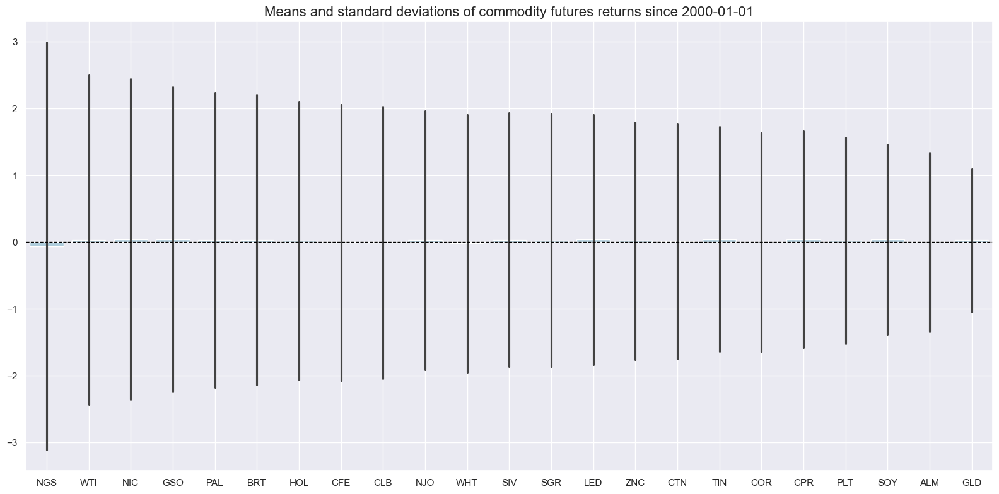

In [21]:
xcatx = ["COXR_NSA"]

msp.view_ranges(
    dfx,
    cids=cids,
    xcats=xcatx,
    kind="bar",
    sort_cids_by="std",
    title=f"Means and standard deviations of commodity futures returns since {sdate}",
    start=sdate,
    legend_bbox_to_anchor=(1, 1)
)

The correlation matrix of commodity futures returns displays a positive correlation since 2000:

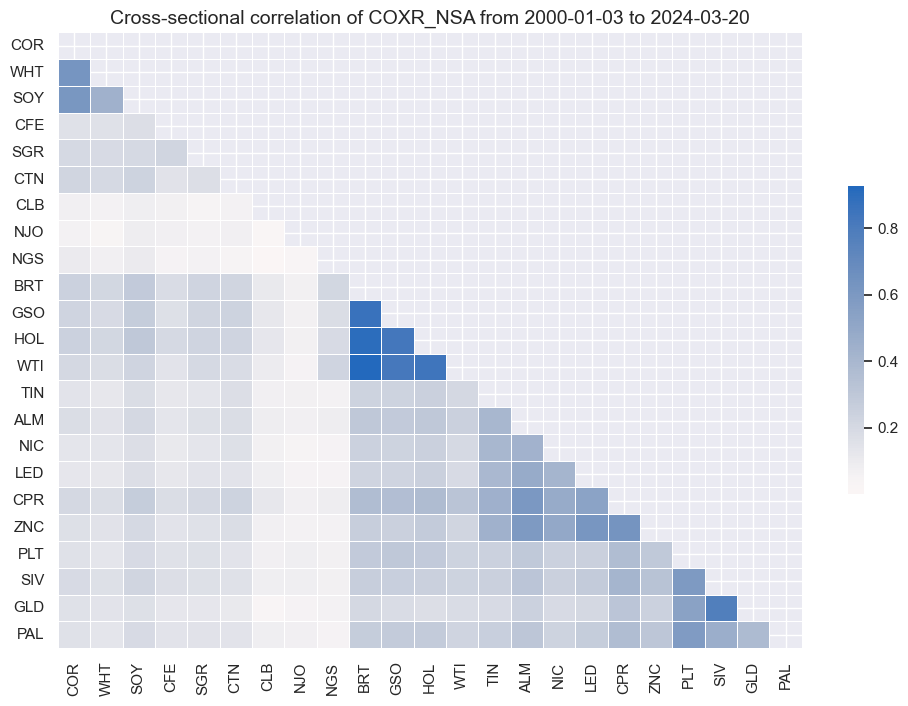

In [22]:
msp.correl_matrix(
    dfx,
    xcats="COXR_NSA",
    cids=cids,
    title=None,
    size=(12, 8),
    start=sdate,
    cluster=True
)

Cumulative volatility-targeted commodity futures returns for all commodities can be quickly displayed with the help of the customized function [`view_timelines()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#visualize-panel-time-series-with-view-timelines) from the `macrosynergy` package:

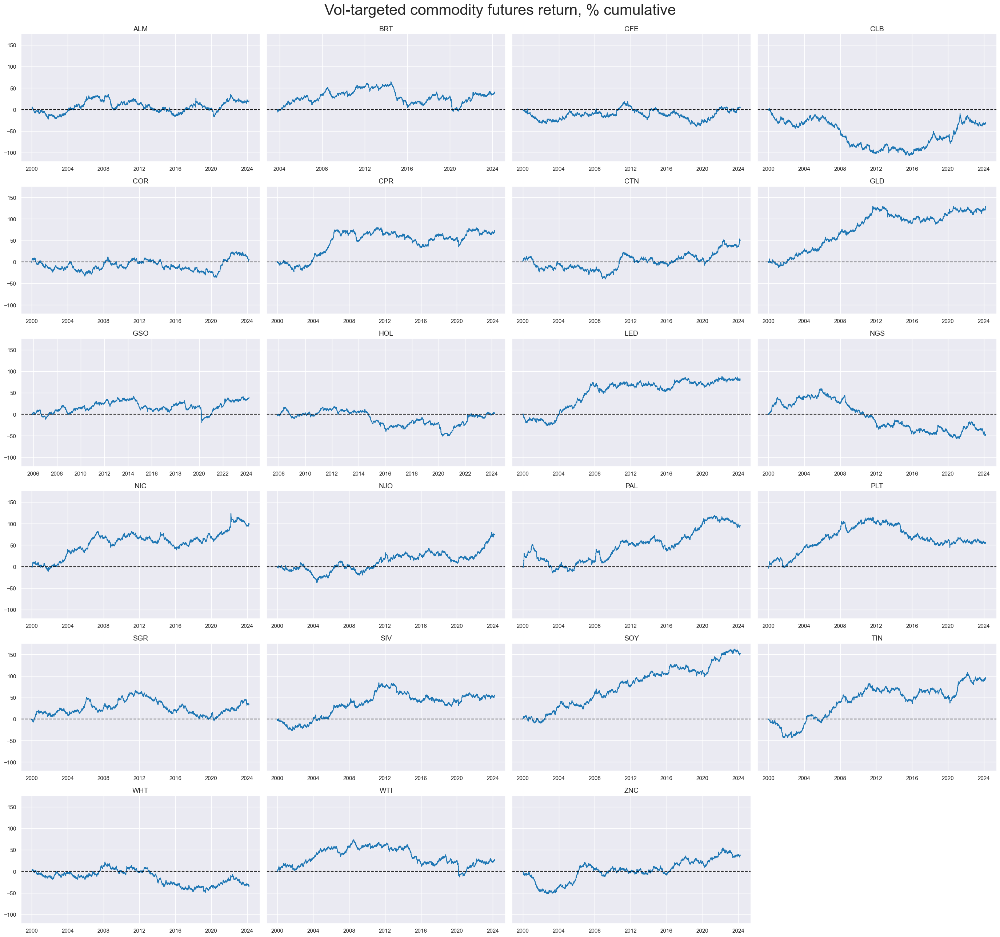

In [23]:
xcatx = ["COXR_VT10"]

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cids,
    ncol=4,
    cumsum=True,
    start=sdate,
    same_y=True,
    all_xticks=True,
    title="Vol-targeted commodity futures return, % cumulative",
    title_fontsize=30,
    legend_fontsize=18,
    )

#### Relative returns to entire commodity basket

The [`make_relative_value()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#compute-panels-versus-basket-with-make-relative-value) function generates a data frame of relative values for a given list of categories. In this case, “relative” means that the original value is compared to a basket average. By default, the basket consists of all available cross-sections, and the relative value is calculated by subtracting the basket average from individual cross-section values. Here, we calculate relative vol-targeted commodity future returns. The new time series receives postfix `vGCO` (versus Global commodities) - the same postfix as for relative futures commodity real carry calculated above. 

In [24]:
xcatx = ["COXR_VT10"]

dfa = msp.make_relative_value(
    dfx,
    xcats=xcatx,
    cids=cids,
    blacklist=None,
    rel_meth="subtract",
    rel_xcats=None,
    postfix="vGCO",
)

dfx = msm.update_df(dfx, dfa)

#### Relative returns to specific commodity basket

Another way to look at relative return is to look at it relative not to all commodities but to respective commodity groups. As distinct groups, we choose the following:

- `"PRM"` -  precious metals (gold, silver, palladium, and platinum), 
- `"INM"` - base metals (aluminum, copper, lead, nickel, tin, and zinc), 
- `"ENE"` - fuels (Brent, WTI, natural gas, gasoline and heating oil), 
- `"GRA"` - U.S. corn belt crops (cotton, corn, soy and wheat), and 
- `"SOF"` - other agricultural commodities (coffee, sugar, orange juice, and lumber). 

Here, we calculate the relative return to the respective group, so if a commodity belongs to precious metals, we calculate the relative return to the average of the precious metals group, not to the average return of all commodities. The new category receives postfix `vRCO` (the same postfix as for relative intra-group commodities futures carry calculated above in this notebook)

In [25]:
xcatx = ["COXR_VT10"]
comm_groups = {
    "PRM": ["GLD", "SIV", "PAL", "PLT"],  # Precious metals
    "INM": ["ALM", "CPR", "LED", "NIC", "TIN", "ZNC"], # Industrial metals
    "ENE": ["BRT", "WTI", "NGS", "GSO", "HOL"],  # Energy
    "GRA": ["COR", "WHT", "SOY", "CTN"],  # Grains
    "SOF": ["CFE", "SGR", "NJO", "CLB"]
}

dfa = pd.DataFrame(columns=list(dfx.columns))
for new_cid, cid_group in comm_groups.items():
    dfaa = msp.make_relative_value(
        dfx,
        xcats=xcatx,
        cids=cid_group,
        blacklist=None,
        rel_meth="subtract",
        rel_xcats=None,
        postfix="vRCO",
    )
    dfa = msm.update_df(dfa, dfaa)
    
dfx = msm.update_df(dfx, dfa)

All three types of volatility targeted cumulative commodity returns: 
 
- "outright", 
- "relative to global commodity average", and 
- "relative to group commodity average" 

are displayed for comparison with the help of customized function [`view_timelines()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#visualize-panel-time-series-with-view-timelines) from the `macrosynergy` package:

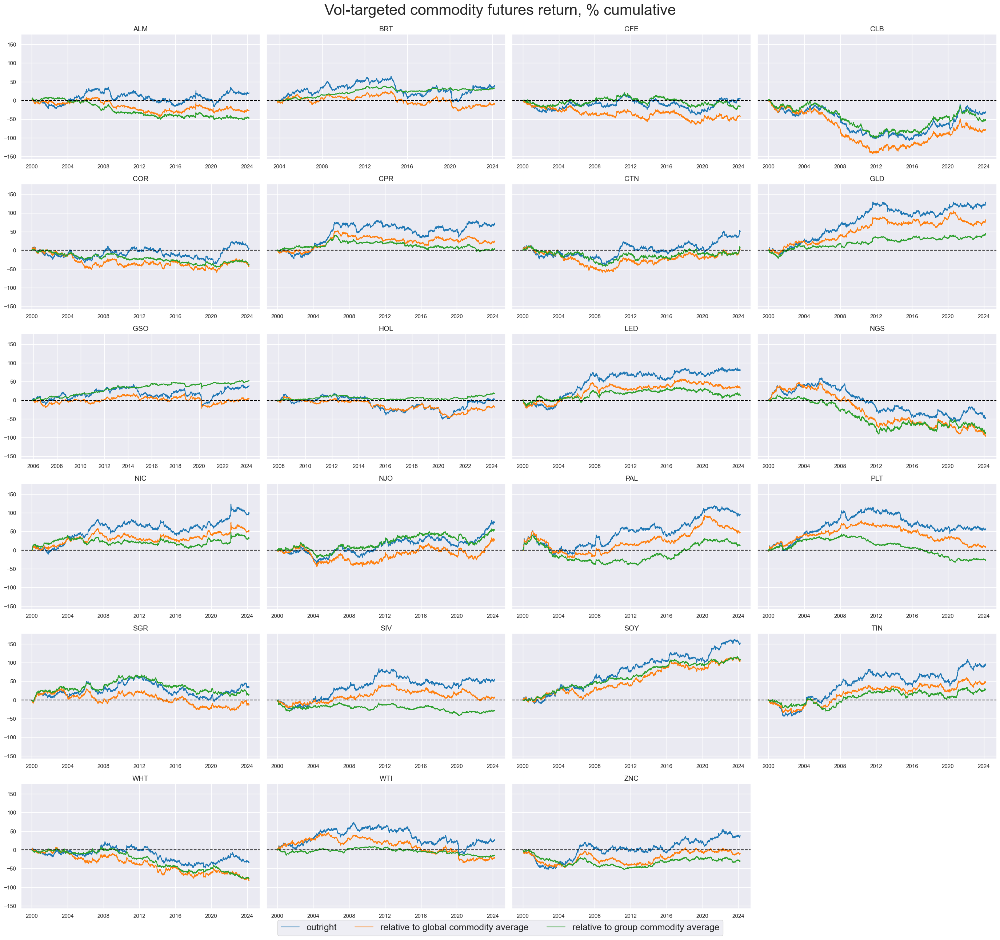

In [26]:
xcatx = ["COXR_VT10", "COXR_VT10vGCO", "COXR_VT10vRCO"]

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cids,
    ncol=4,
    cumsum=True,
    start=sdate,
    same_y=True,
    all_xticks=True,
    title="Vol-targeted commodity futures return, % cumulative",
    title_fontsize=30,
    xcat_labels=["outright", "relative to global commodity average", "relative to group commodity average"],
    legend_fontsize=18,
    )

## Value checks

In this part of the analysis, the notebook calculates the naive PnLs (Profit and Loss) for commodity future returns using commodity carry as signals. The PnLs are calculated based on simple trading strategies that utilize the carry as signals (no regression is involved). The strategies involve going long (buying) or short (selling) on commodity positions based purely on the direction of the carry.

To evaluate the performance of these strategies, the notebook computes various metrics and ratios, including:

- Correlation: Measures the relationship between the changes in carry and consequent commodity returns. Positive correlations indicate that the strategy moves in the same direction as the market, while negative correlations indicate an opposite movement.

- Accuracy Metrics: These metrics assess the accuracy of the confidence carry based strategies in predicting market movements. Common accuracy metrics include accuracy rate, balanced accuracy, precision etc.

- Performance Ratios: Various performance ratios, such as Sharpe ratio, Sortino ratio, Max draws etc.

The notebook compares the performance of three simple carry-based strategies with the long-only performance of commodity futures. 

The three strategies investigated in this notebook are: 

   - Directional strategy: real commodity carry as a predictor for subsequent outright commodity futures returns.
   - Relative to global commodity basket: relative commodity carry as a predictor of subsequent global relative commodity futures returns.
   - Relative to specific commodity group baskets: relative commodity carry as a predictor for subsequent intra-group relative commodity futures returns.

It's important to note that the analysis deliberately disregards transaction costs and risk management considerations. This is done to provide a more straightforward comparison of the strategies' raw performance without the additional complexity introduced by transaction costs and risk management, which can vary based on trading size, institutional rules, and regulations.

### Directional

This part of the notebook aims to investigate the initial hypothesis regarding the predictive capability of commodity carry in anticipating future outright commodity returns. 

#### Specs and panel test

We establish a dictionary encompassing a list of potential signals for initial data analysis and ease of use. The primary signal under consideration is `COCRR_SAVT10_ZNI`, which represents normalized real seasonally-adjusted futures carry with volatility targeting. Other signals to be explored include non-seasonally adjusted carry and non-volatility targeted carry versions, as well as non-normalized signals. The targeted return here is `COXR_VT10`, representing commodity future returns with volatility targeting. 

In [27]:
sigs = [
    "COCRR_SAVT10_ZNI",
    "COCRR_SAVT10", 
    "COCRR_SA",
    "COCRR_SA_ZNI"
    "COCRR_NSA",
    "COCRR_VT10",
    "COCRR_VT10_ZNI",
    "COCRR_NSA_ZNI",
]

targ = "COXR_VT10"
start = "2000-01-01"


dict_dir = {
    "sigs": sigs,
    "targ": targ,
    "cidx": cids,
    "start": start,
    "black": None,
    "srr": None,
    "pnls": None,
}

Using function [`CategoryRelations()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#investigate-relations-between-panels-with-categoryrelations) from `macrosynergy` package we visualize the relationship between the main signal and the target. The function allows aggregation (last value for signal and sum for target), monthly reestimation frequency, and lag of 1 month (i.e., we estimate the relationship between the signal and subsequent target and thus test the signal's predictive power). As the signal, we use seasonally adjusted vol-targeted carry, normalized and windorized `COCRR_SAVT10_ZNI` and the target is commodity basket return `COXR_VT10`

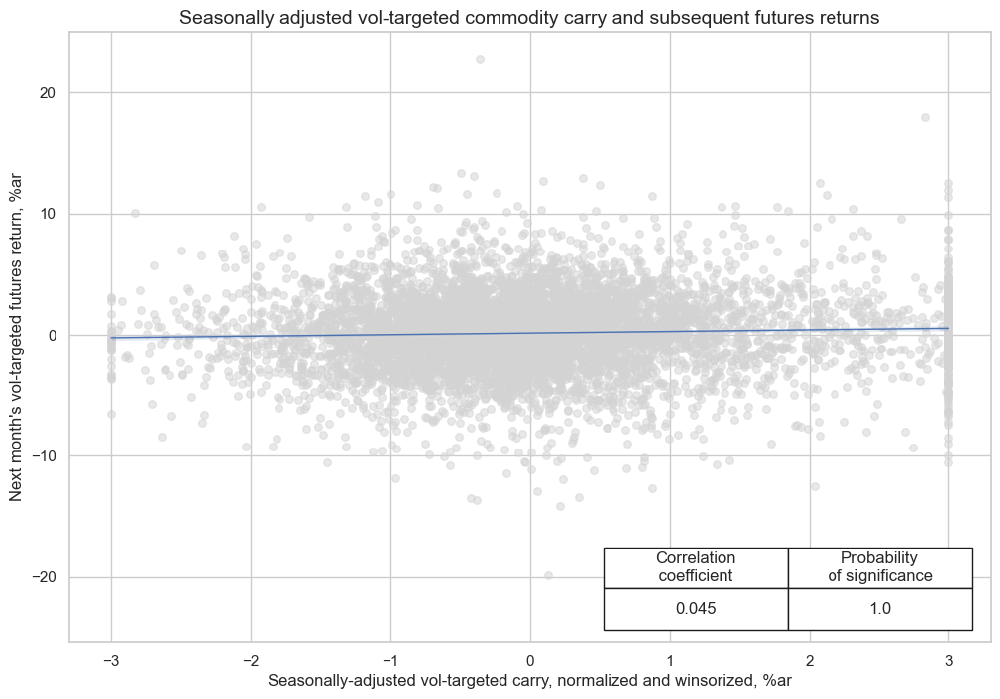

In [28]:
cr = msp.CategoryRelations(
    dfx,
    xcats=[sigs[0], targ],
    cids=cids,
    freq="M",
    lag=1,
    xcat_aggs=["last", "sum"],
    fwin=1,
    start=sdate,
)
cr.reg_scatter(
    labels=False,
    coef_box="lower right",
    title = "Seasonally adjusted vol-targeted commodity carry and subsequent futures returns",
    xlab="Seasonally-adjusted vol-targeted carry, normalized and winsorized, %ar",
    ylab="Next month's vol-targeted futures return, %ar",
    prob_est="map",
)

#### Accuracy and correlation check

The [`SignalReturnRelations`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#signalreturnrelations) class from the macrosynergy.signal module is specifically designed to analyze, visualize, and compare the relationships between panels of trading signals and panels of subsequent returns. 

In [29]:
sigs = [
    "COCRR_SAVT10_ZNI",
    "COCRR_SAVT10",
    "COCRR_SA",
    "COCRR_SA_ZNI",
    "COCRR_NSA",
    "COCRR_VT10",
    "COCRR_VT10_ZNI",
    "COCRR_NSA_ZNI"
]

srr = mss.SignalReturnRelations(
    dfx,
    cids=cids,
    sigs=sigs,
    rets=targ,
    freqs="M",
    start="2000-01-01",
)


The [`.summary_table()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#signalreturnrelations) of the SignalReturnRelations class gives a short high-level snapshot of the strength and stability of the main signal relation (seasonally adjusted vol-targeted carry, normalized and windorized `COCRR_SAVT10_ZNI`) and the target is commodity basket return `COXR_VT10`.

In [30]:
display(srr.summary_table().astype("float").round(3))

,accuracy,bal_accuracy,pos_sigr,pos_retr,pos_prec,neg_prec,pearson,pearson_pval,kendall,kendall_pval,auc
Panel,0.526,0.528,0.469,0.522,0.551,0.505,0.045,0.000,0.041,0.000,0.528
Mean years,0.529,0.535,0.466,0.521,0.564,0.506,0.049,0.332,0.044,0.329,0.533
Positive ratio,0.880,0.840,0.360,0.680,0.720,0.440,0.720,0.600,0.880,0.720,0.840
Mean cids,0.527,0.516,0.474,0.523,0.534,0.498,0.031,0.462,0.026,0.422,0.515
Positive ratio,0.870,0.783,0.522,0.696,0.696,0.435,0.696,0.391,0.652,0.522,0.783


[`multiple_relations_table()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#summary-tables) is a method that compares multiple signal-return relations in one table. It is useful to compare the performance of different signals against the same return series (more than one possible financial return) and multiple possible frequencies. The method returns a table with standard columns used for [summary tables](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#summary-tables), but the rows display different signals from the list of signals specified under `SignalReturnsRelations()` sigs list. The row names indicate the frequency (‘D,’ ‘W,’ ‘M,’ ‘Q,’ ‘A’) followed by the signal’s and return’s names. 

In [31]:
srr.multiple_relations_table().astype("float").round(3)

,accuracy,bal_accuracy,pos_sigr,pos_retr,pos_prec,neg_prec,pearson,pearson_pval,kendall,kendall_pval,auc
M: COCRR_NSA/last => COXR_VT10,0.516,0.518,0.453,0.521,0.541,0.496,0.001,0.929,0.035,0.0,0.518
M: COCRR_NSA_ZNI/last => COXR_VT10,0.515,0.518,0.453,0.522,0.541,0.494,0.034,0.007,0.031,0.0,0.518
M: COCRR_SA/last => COXR_VT10,0.527,0.528,0.468,0.521,0.551,0.506,0.007,0.591,0.044,0.0,0.528
M: COCRR_SAVT10/last => COXR_VT10,0.527,0.528,0.468,0.521,0.551,0.506,0.019,0.130,0.046,0.0,0.528
M: COCRR_SAVT10_ZNI/last => COXR_VT10,0.526,0.528,0.469,0.522,0.551,0.505,0.045,0.000,0.041,0.0,0.528
M: COCRR_SA_ZNI/last => COXR_VT10,0.526,0.528,0.469,0.522,0.551,0.505,0.045,0.000,0.039,0.0,0.528
M: COCRR_VT10/last => COXR_VT10,0.516,0.518,0.453,0.521,0.541,0.496,0.011,0.385,0.037,0.0,0.518
M: COCRR_VT10_ZNI/last => COXR_VT10,0.515,0.518,0.453,0.522,0.541,0.494,0.035,0.005,0.033,0.0,0.518


The [`accuracy_bars`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#accuracy-bars) method shows the accuracy and balanced accuracy of the predicted relationship for the main signal (`"COCRR_SAVT10_ZNI"`). This can be displayed either by cross-section or by year

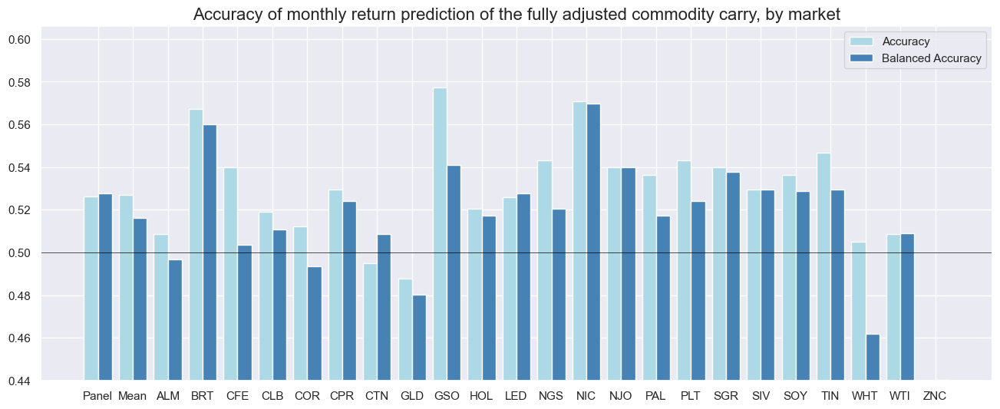

In [32]:
srr.accuracy_bars(
    type="cross_section",
    title="Accuracy of monthly return prediction of the fully adjusted commodity carry, by market",
    size=(16, 6),
)

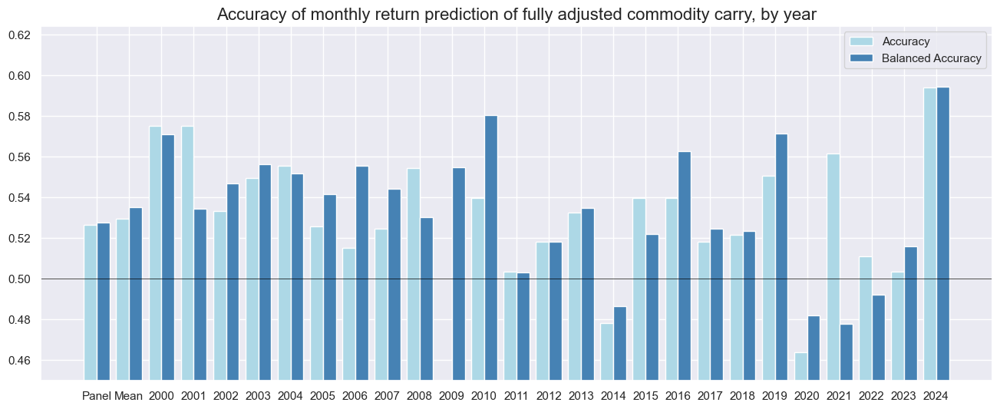

In [33]:
srr.accuracy_bars(
    type="years",
    title="Accuracy of monthly return prediction of fully adjusted commodity carry, by year",
    size=(16, 6),
)

#### Naive PnL

We calculate stylized PnLs, i.e., dollar-based profit and loss developments over and above funding costs, according to standard rules applied in previous posts. This is done with `macrosynergy`'s custom class [`NaivePnL`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#naivepnl). Upon instantiation, we define the list of signals, target variable (`COXR_VT10`), list of cross-sections (all available in our case) and (optionally) benchmark (we choose here `USD_EQXR_NSA`, USD equity index futures returns and  `GLB_DRBXR_NSA` - Directional risk basket returns)

Positions are re-calculated monthly at the end of the week and re-balanced in the following with a one-day slippage for trading time.
The long-term volatility of the PnL for positions across all currency areas has been set to 10% annualized. This is no proper vol-targeting but mainly a scaling that makes it easy to compare different types of PnLs in graphs.

In [34]:
dix = dict_dir

targ = dix["targ"]

pnl = msn.NaivePnL(
    dfx,
    ret=targ,
    sigs=sigs,
    cids=cids,
    start="2000-01-01",
    bms=["USD_EQXR_NSA", "GLB_DRBXR_NSA"],
)

for sig in sigs:
    pnl.make_pnl(
        sig,
        sig_neg=False,
        sig_op="zn_score_pan",
        thresh=2,
        rebal_freq="monthly",
        vol_scale=10,
        rebal_slip=1,
        pnl_name=sig + "_PZN",
    )
    
pnl.make_long_pnl(vol_scale=10, label="Long only")
dix["pnls"] = pnl

Here we simply plot directional naive PnL alongside long only PnL:

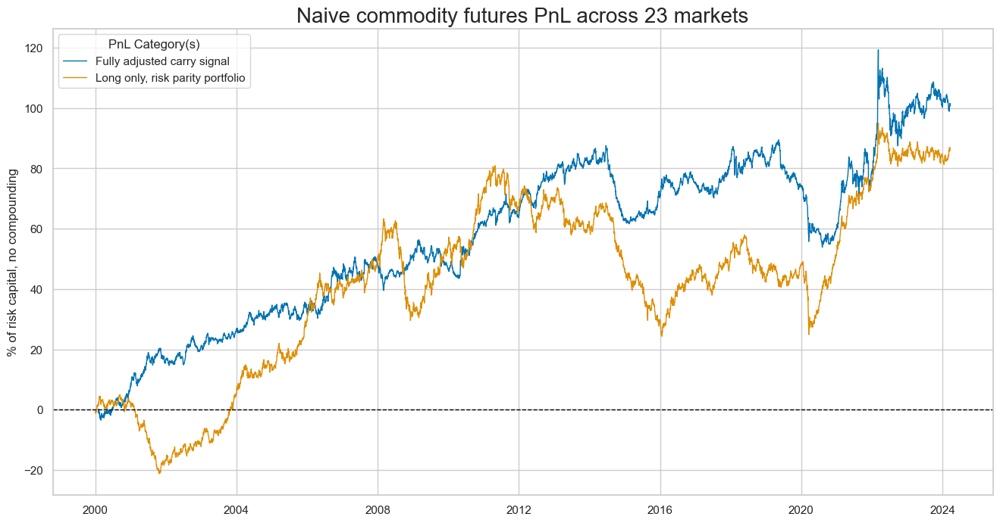

In [37]:
dix = dict_dir

start = dix["start"]
cidx = dix["cidx"]
sig = [dix["sigs"]]

pnls = [sigs[0] + "_PZN"] + ["Long only"]
dict_labels = {"COCRR_SAVT10_ZNI_PZN": "Fully adjusted carry signal", 
               "Long only": "Long only, risk parity portfolio"}



pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
    title="Naive commodity futures PnL across 23 markets",
    xcat_labels=dict_labels,
    figsize=(16, 8),
)

To compare PnLs generated by all signals we define a simple dictionary assigning more readable names to the technical tickers:

In [38]:
dict_pnl = {
    "COCRR_SAVT10_ZNI_PZN": "Fully adjusted carry",
    "COCRR_SAVT10_PZN": "Seasonally-adjusted and vol-targeted real carry",
    
    "COCRR_VT10_ZNI_PZN": "Vol-targeted, normalized and winsorized real carry",
    "COCRR_VT10_PZN": "Vol-targeted real carry",
    
    "COCRR_SA_ZNI_PZN": "Seasonally-adjusted, normalized and winsorized real carry",
    "COCRR_SA_PZN": "Seasonally-adjusted real carry",
    
    "COCRR_NSA_ZNI_PZN": "Normalized and winsorized real carry",
    "COCRR_NSA_PZN": "Real carry",
    
    "Long only": "Long only, risk parity portfolio",
}

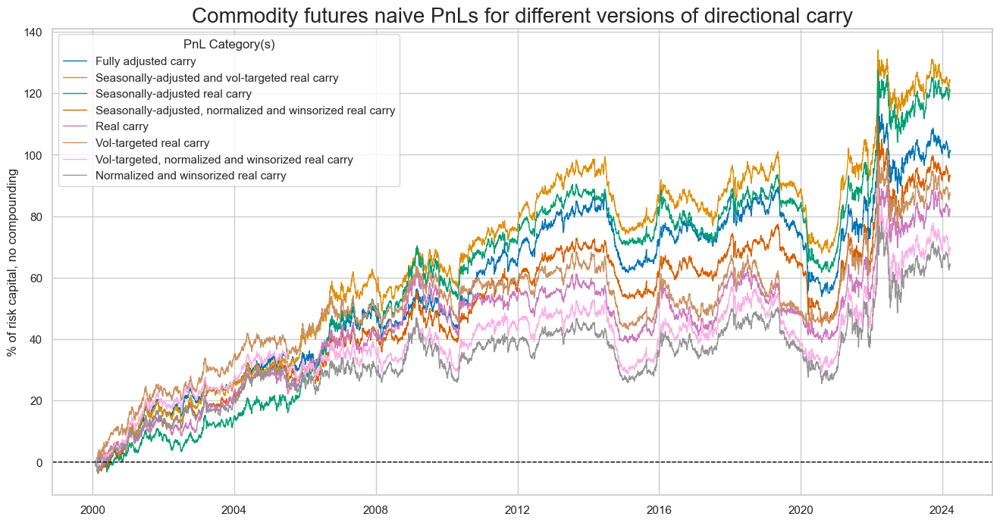

In [39]:
dix = dict_dir

start = dix["start"]
cidx = dix["cidx"]

naive_pnl = dix["pnls"]

pnls = [s + "_PZN" for s in sigs] 

naive_pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
    title="Commodity futures naive PnLs for different versions of directional carry",
    figsize=(16, 8),
    xcat_labels=[dict_pnl[k] for k in pnls],
)

The summary of key performance metrics for signals alongside "long only" PnL can be displayed with the method [`evaluate_pnls()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php?highlight=evaluate#evaluate-pnls), which returns a small dataframe of key PnL statistics.

In [40]:
dix = dict_dir

pnl = dix["pnls"]
pnls = [sig + type for sig in sigs for type in ["_PZN"]] + ["Long only"]

df_eval = pnl.evaluate_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start="2000-01-01",
)


In [41]:
display(df_eval.transpose().astype("float").round(3))

,Return (pct ar),St. Dev. (pct ar),Sharpe Ratio,Sortino Ratio,Max 21-day draw,Max 6-month draw,USD_EQXR_NSA correl,GLB_DRBXR_NSA correl,Traded Months
xcat,,,,,,,,,
COCRR_NSA_PZN,3.372,10.0,0.337,0.471,-15.558,-17.855,-0.078,-0.030,291.0
COCRR_NSA_ZNI_PZN,2.637,10.0,0.264,0.367,-20.096,-26.103,-0.050,-0.001,291.0
COCRR_SAVT10_PZN,5.127,10.0,0.513,0.723,-14.850,-23.579,-0.035,0.008,291.0
COCRR_SAVT10_ZNI_PZN,4.172,10.0,0.417,0.586,-16.579,-24.183,-0.017,0.030,291.0
COCRR_SA_PZN,4.991,10.0,0.499,0.704,-14.578,-20.596,-0.052,-0.003,291.0
COCRR_SA_ZNI_PZN,3.840,10.0,0.384,0.539,-18.484,-25.676,-0.027,0.021,291.0
COCRR_VT10_PZN,3.585,10.0,0.359,0.501,-14.248,-22.505,-0.063,-0.026,291.0
COCRR_VT10_ZNI_PZN,2.856,10.0,0.286,0.399,-18.248,-24.575,-0.041,0.004,291.0
Long only,3.548,10.0,0.355,0.490,-20.316,-31.813,0.290,0.439,291.0


#### Naive long-biased PnL

In this example, we add one standard deviation to the normalized carry signals of the naïve PnL generator, creating a long-biased strategy (this is done with the optional parameter `sig_add`, which adds a constant to the signal after initial transformation). This allows to give PnLs a long (if a constant is positive) or short bias (negative constant) relative to the signal score. We add here `sig_add=1` to indicate one standard deviation.

In [42]:
dix = dict_dir

targ = dix["targ"]
cidx = dix["cidx"]

pnl = msn.NaivePnL(
    dfx,
    ret=targ,
    sigs=sigs,
    cids=cidx,
    start="2000-01-01",
    bms=["USD_EQXR_NSA", "GLB_DRBXR_NSA"],
)

for sig in sigs:
    pnl.make_pnl(
        sig,
        sig_neg=False,
        sig_op="zn_score_pan",
        sig_add=1,  # add a constant to the signal after the initial transformation. This allows to give PnLs a long or short bias relative to the signal score
        thresh=2,
        rebal_freq="monthly",
        vol_scale=10,
        rebal_slip=1,
        pnl_name=sig + "_PZN",
    )
    
pnl.make_long_pnl(vol_scale=10, label="Long only")
dix["pnls_long"] = pnl

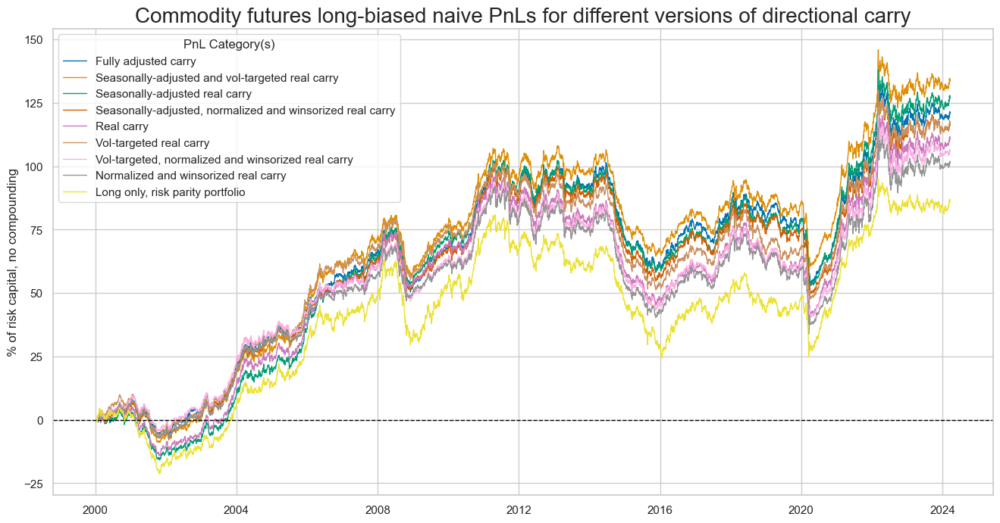

In [43]:
dix = dict_dir

start = dix["start"]
cidx = dix["cidx"]

pnl = dix["pnls_long"] 

pnls = [s + "_PZN" for s in sigs] + ["Long only"]
pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
    title="Commodity futures long-biased naive PnLs for different versions of directional carry",
    figsize=(16, 8),
    xcat_labels=[dict_pnl[k] for k in pnls],
)

The summary of key performance metrics for signals alongside "long only" PnL can be displayed with the method [`evaluate_pnls()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php?highlight=evaluate#evaluate-pnls), which returns a small dataframe of key PnL statistics.

In [44]:
dix = dict_dir

pnl = dix["pnls_long"]
pnls = [sig + type for sig in sigs for type in ["_PZN"]] + ["Long only"]

df_eval = pnl.evaluate_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start="2000-01-01",
)

In [45]:
display(df_eval.transpose().astype("float").round(3))

,Return (pct ar),St. Dev. (pct ar),Sharpe Ratio,Sortino Ratio,Max 21-day draw,Max 6-month draw,USD_EQXR_NSA correl,GLB_DRBXR_NSA correl,Traded Months
xcat,,,,,,,,,
COCRR_NSA_PZN,4.577,10.0,0.458,0.630,-20.991,-26.165,0.224,0.384,291.0
COCRR_NSA_ZNI_PZN,4.187,10.0,0.419,0.572,-21.802,-27.316,0.211,0.362,291.0
COCRR_SAVT10_PZN,5.533,10.0,0.553,0.765,-24.379,-27.912,0.232,0.384,291.0
COCRR_SAVT10_ZNI_PZN,4.998,10.0,0.500,0.686,-24.728,-28.743,0.222,0.367,291.0
COCRR_SA_PZN,5.252,10.0,0.525,0.726,-24.464,-27.093,0.228,0.387,291.0
COCRR_SA_ZNI_PZN,4.808,10.0,0.481,0.659,-24.759,-27.597,0.216,0.364,291.0
COCRR_VT10_PZN,4.831,10.0,0.483,0.666,-20.753,-26.592,0.228,0.381,291.0
COCRR_VT10_ZNI_PZN,4.380,10.0,0.438,0.599,-21.174,-26.819,0.217,0.363,291.0
Long only,3.548,10.0,0.355,0.490,-20.316,-31.813,0.290,0.439,291.0


### Relative to global commodity basket

This part investigates the second type of trading strategy based on carry: relative carry values to the global commodity basket. For relative signals, we can reasonably only consider vol-targeted carry signals for the sake of making cross-commodity signal positions comparable. As a target we look at relative, vol-adjusted commodity future return `COXR_VT10vGCO`

#### Specs and panel test

In [46]:
sigs = [cr + "vGCO" for cr in sigs if "VT10" in cr]

targ = "COXR_VT10vGCO"
cidx = cids
start = "2000-01-01"

dict_rel = {
    "sig": sigs,
    "targ": targ,
    "cidx": cidx,
    "start": start,
    "black": None,
    "srr": None,
    "pnls": None,
}

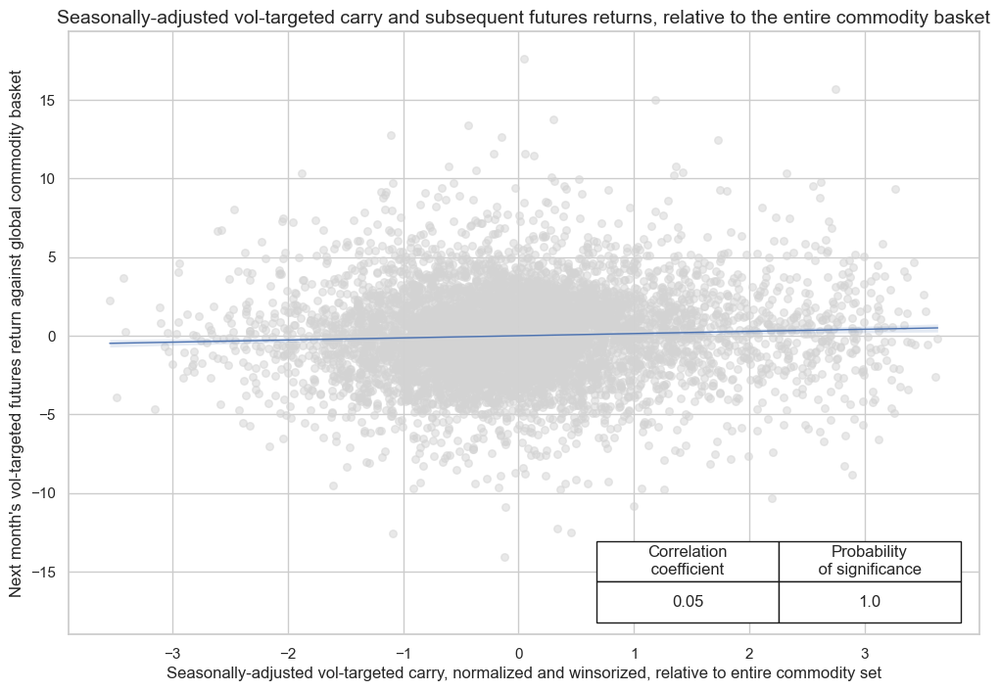

In [47]:
dix = dict_rel

sig = dix["sig"]
targ = dix["targ"]
cidx = dix["cidx"]

cr = msp.CategoryRelations(
    dfx,
    xcats=[sigs[0], targ],
    cids=cidx,
    freq="M",
    lag=1,
    xcat_aggs=["last", "sum"],
    fwin=1,
    start=dix["start"],
)
cr.reg_scatter(
    labels=False,
    coef_box="lower right",
    title = "Seasonally-adjusted vol-targeted carry and subsequent futures returns, relative to the entire commodity basket",
    xlab="Seasonally-adjusted vol-targeted carry, normalized and winsorized, relative to entire commodity set",
    ylab="Next month's vol-targeted futures return against global commodity basket",
    prob_est="map",
)

#### Accuracy and correlation check

The [`SignalReturnRelations`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#signalreturnrelations) class from the macrosynergy.signal module is specifically designed to analyze, visualize, and compare the relationships between panels of trading signals and panels of subsequent returns.

In [48]:
dix = dict_rel

sig = dix["sig"]
targ = dix["targ"]
cidx = dix["cidx"]

srr = mss.SignalReturnRelations(
    dfx,
    cids=cidx,
    sigs=sigs,
    rets=targ,
    freqs="M",
    start="2000-01-01",
)

dix["srr"] = srr

As for the outright strategy, we use tables to compare basic statistics among different signals. The [`.summary_table()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#signalreturnrelations) of the SignalReturnRelations class gives a high-level snapshot of the strength and stability of the main signal relation (seasonally adjusted relative vol-targeted carry, normalized and windorized `'COCRR_SAVT10_ZNIvGCO'`) and the target is relative commodity basket return `COXR_VT10vGCO`.

In [49]:
display(srr.summary_table().astype("float").round(3))

,accuracy,bal_accuracy,pos_sigr,pos_retr,pos_prec,neg_prec,pearson,pearson_pval,kendall,kendall_pval,auc
Panel,0.535,0.535,0.460,0.490,0.527,0.542,0.050,0.000,0.045,0.000,0.535
Mean years,0.538,0.536,0.460,0.488,0.527,0.546,0.055,0.360,0.047,0.320,0.536
Positive ratio,0.840,0.840,0.120,0.360,0.760,0.880,0.840,0.560,0.840,0.680,0.840
Mean cids,0.536,0.523,0.465,0.491,0.509,0.537,0.034,0.439,0.029,0.408,0.523
Positive ratio,0.870,0.696,0.522,0.391,0.609,0.783,0.609,0.435,0.696,0.478,0.696


To compare different signals in one table we use [`multiple_relations_table()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#summary-tables). The method returns a table with standard columns used for [summary tables](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#summary-tables), but the rows display different signals from the list of signals specified under `SignalReturnsRelations()` sigs list. The row names indicate the frequency (‘D,’ ‘W,’ ‘M,’ ‘Q,’ ‘A’) followed by the signal’s and return’s names. 

In [50]:
srr.multiple_relations_table().astype("float").round(3)

,accuracy,bal_accuracy,pos_sigr,pos_retr,pos_prec,neg_prec,pearson,pearson_pval,kendall,kendall_pval,auc
M: COCRR_SAVT10_ZNIvGCO/last => COXR_VT10vGCO,0.535,0.535,0.460,0.490,0.527,0.542,0.050,0.000,0.045,0.0,0.535
M: COCRR_SAVT10vGCO/last => COXR_VT10vGCO,0.536,0.535,0.456,0.489,0.528,0.543,0.024,0.052,0.054,0.0,0.535
M: COCRR_VT10_ZNIvGCO/last => COXR_VT10vGCO,0.521,0.520,0.452,0.490,0.512,0.528,0.039,0.002,0.033,0.0,0.520
M: COCRR_VT10vGCO/last => COXR_VT10vGCO,0.529,0.528,0.448,0.489,0.520,0.536,0.016,0.188,0.039,0.0,0.527


The [`accuracy_bars`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#accuracy-bars) method shows accuracy and balanced accuracy of the predicted relationship for the main signal (`"COCRR_SAVT10_ZNIvGCO"`). This can be displayed either by cross-section or by year.

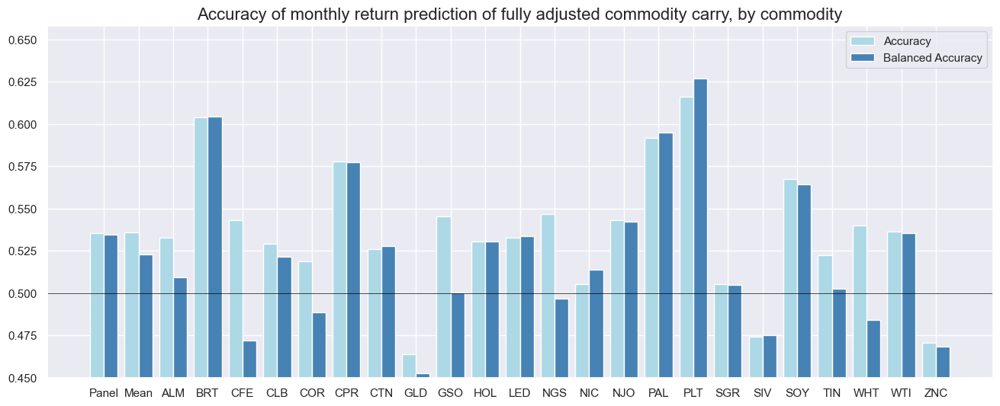

In [51]:
srr.accuracy_bars(
    type="cross_section",
    title="Accuracy of monthly return prediction of fully adjusted commodity carry, by commodity",
    size=(16, 6),
)

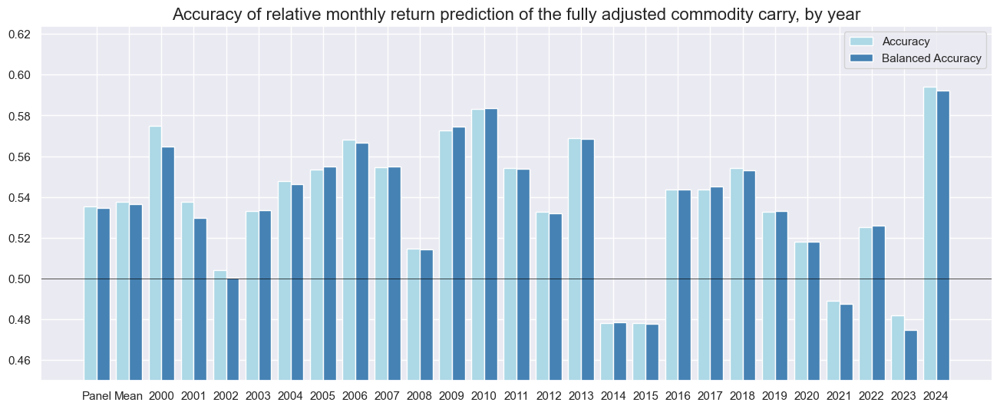

In [52]:
srr.accuracy_bars(
    type="years",
    title="Accuracy of relative monthly return prediction of the fully adjusted commodity carry, by year",
    size=(16, 6),
)

The method [`.correlation_bars()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php?highlight=evaluate#correlation-bars) visualizes positive correlation probabilities based on parametric (Pearson) and non-parametric (Kendall) correlation statistics and compares signals between each other, across countries, or years.

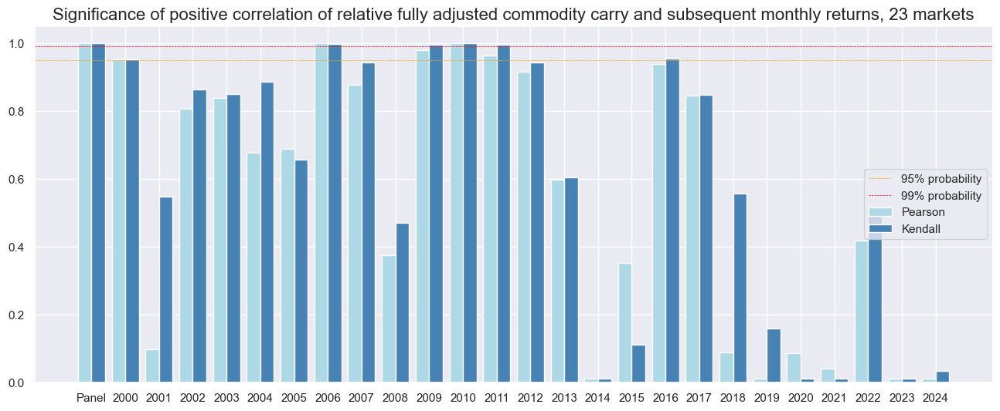

In [53]:
srr.correlation_bars(
    type="years",
    title="Significance of positive correlation of relative fully adjusted commodity carry and subsequent monthly returns, 23 markets",
    size=(16, 6),
)

#### Naive PnL

We calculate stylized PnLs, i.e., dollar-based profit and loss developments over and above funding costs, according to standard rules applied in previous posts. This is done with `macrosynergy`'s custom class [`NaivePnL`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#naivepnl). Upon instantiation, we define the list of signals, target variable (`COXR_VT10vGCO`), list of cross-sections (all available in our case) and (optionally) benchmark (we choose here `USD_EQXR_NSA`, USD equity index futures returns and  `GLB_DRBXR_NSA` - Directional risk basket returns)

Positions are re-calculated monthly at the end of the week and re-balanced in the following with a one-day slippage for trading time.
The long-term volatility of the PnL for positions across all currency areas has been set to 10% annualized. This is no proper vol-targeting but mainly a scaling that makes it easy to compare different types of PnLs in graphs.

In [54]:
dix = dict_rel

targ = dix["targ"]
cidx = dix["cidx"]

pnl = msn.NaivePnL(
    dfx,
    ret=targ,
    sigs=sigs,
    cids=cidx,
    start="2000-01-01",
    bms=["USD_EQXR_NSA", "GLB_DRBXR_NSA"],
)

for sig in sigs:
    pnl.make_pnl(
        sig,
        sig_neg=False,
        sig_op="zn_score_pan",
        thresh=2,
        rebal_freq="monthly",
        vol_scale=10,
        rebal_slip=1,
        pnl_name=sig + "_PZN",
    )
    
dix["pnls"] = pnl

In [55]:
dict_pnr = {
    "COCRR_SAVT10_ZNIvGCO_PZN": "Fully adjusted carry",
    "COCRR_SAVT10vGCO_PZN": "Seasonally-adjusted and vol-targeted real carry",
    
    "COCRR_VT10_ZNIvGCO_PZN": "Vol-targeted, normalized and winsorized real carry",
    "COCRR_VT10vGCO_PZN": "Vol-targeted, norma;lized and winsorized real carry",
}

We utilize the [`.plot_pnls()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php?highlight=evaluate#plot-pnls) method to straightforwardly visualize the naive Profit and Loss (PnLs) for all chosen signals. 

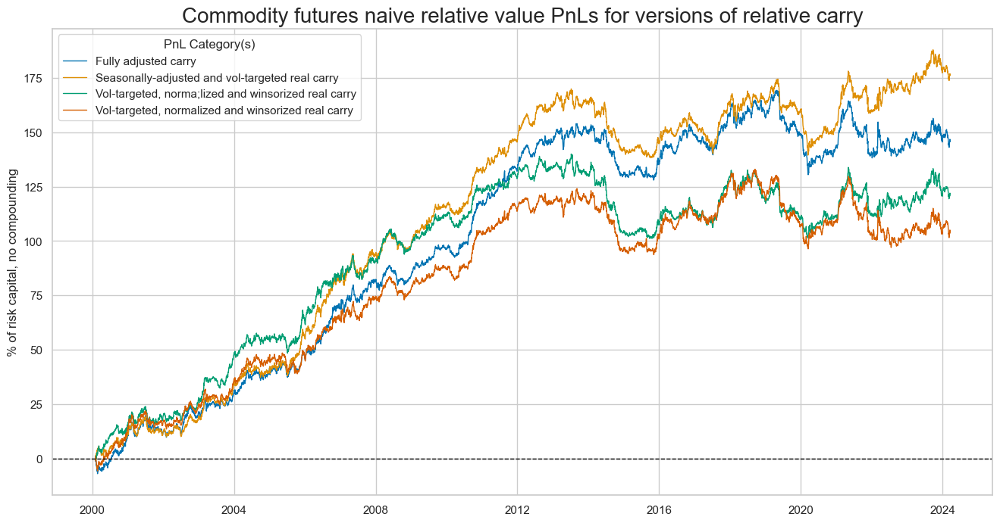

In [56]:
dix = dict_rel

start = dix["start"]
cidx = dix["cidx"]

naive_pnl = dix["pnls"]

pnls = [s + "_PZN" for s in sigs] 
naive_pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    title="Commodity futures naive relative value PnLs for versions of relative carry",
    figsize=(16, 8),
    xcat_labels=[dict_pnr[k] for k in pnls],
)

The summary of key performance metrics for signals alongside "long only" PnL can be displayed with the method [`evaluate_pnls()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php?highlight=evaluate#evaluate-pnls), which returns a small dataframe of key PnL statistics.

In [57]:
dix = dict_rel

pnl = dix["pnls"]
pnls = [sig + type for sig in sigs for type in ["_PZN"]]

df_eval = pnl.evaluate_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start="2000-01-01",
)


In [58]:
display(df_eval.transpose())

,Return (pct ar),St. Dev. (pct ar),Sharpe Ratio,Sortino Ratio,Max 21-day draw,Max 6-month draw,USD_EQXR_NSA correl,GLB_DRBXR_NSA correl,Traded Months
xcat,,,,,,,,,
COCRR_SAVT10_ZNIvGCO_PZN,6.034896,10.0,0.60349,0.863208,-13.089743,-22.276771,-0.017338,0.033533,291
COCRR_SAVT10vGCO_PZN,7.30108,10.0,0.730108,1.035271,-13.61194,-24.635466,0.009876,0.066785,291
COCRR_VT10_ZNIvGCO_PZN,4.29287,10.0,0.429287,0.610756,-13.534062,-22.508028,-0.028148,0.025306,291
COCRR_VT10vGCO_PZN,5.003936,10.0,0.500394,0.703539,-14.056721,-25.846821,0.003532,0.058945,291


### Relative to specific commodity group baskets

An alternative to global relative positioning is intra-group relative positioning. As distinct groups, we choose here 

- precious metals (gold, silver, palladium, and platinum), 
- base metals (aluminum, copper, lead, nickel, tin, and zinc), 
- fuels (Brent, WTI, natural gas, gasoline, and heating oil), 
- U.S. corn belt crops (cotton, corn, soy, and wheat), and 
- other agricultural commodities (coffee, sugar, orange juice, and lumber). 

The tested proposition is the predictive power of intra-group relative carry for intra-group relative future return.

#### Specs and panel test

We establish a dictionary encompassing a list of potential signals for initial data analysis and ease of use. The primary signal under consideration is `'COCRR_SAVT10_ZNIvRCO'`, which represents normalized relative real seasonally-adjusted futures carry with volatility targeting. The targeted return here is `COXR_VT10vRCO`, representing intra-group relative commodity future returns with volatility targeting. 

In [59]:


sigs = [cr + "vRCO" for cr in sigs if "VT10" in cr]

targ = "COXR_VT10vRCO"
cidx = cids
start = "2000-01-01"

dict_reg = {
    "sigs": sigs,
    "targ": targ,
    "cidx": cidx,
    "start": start,
    "black": None,
    "srr": None,
    "pnls": None,
}

#### Accuracy and correlation check

As with the previous strategies we use [`SignalReturnRelations`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#signalreturnrelations) class from the macrosynergy.signal module together with [`.summary_table()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php?highlight=evaluate#summary-tables), [`.accuracy_bars()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php?highlight=evaluate#accuracy-bars), and [`.correlation_bars()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php?highlight=evaluate#correlation-bars) to assess and compare strength and consistency of selected relative signals. 

In [60]:
sigs = [
    "COCRR_SAVT10_ZNIvRCO",
    "COCRR_SAVT10vRCO",
    "COCRR_VT10vRCO",
    "COCRR_VT10_ZNIvRCO",
    
]

In [61]:

dix = dict_reg

targ = dix["targ"]
cidx = dix["cidx"]

srr = mss.SignalReturnRelations(
    dfx,
    cids=cidx,
    sigs=sigs,
    rets=targ,
    freqs="M",
    start="2000-01-01",
)

dix["srr"] = srr

In [62]:
display(srr.summary_table().astype("float").round(3))

,accuracy,bal_accuracy,pos_sigr,pos_retr,pos_prec,neg_prec,pearson,pearson_pval,kendall,kendall_pval,auc
Panel,0.525,0.524,0.471,0.495,0.521,0.528,0.063,0.000,0.046,0.000,0.524
Mean years,0.522,0.522,0.470,0.495,0.519,0.524,0.059,0.267,0.041,0.282,0.521
Positive ratio,0.720,0.720,0.200,0.400,0.680,0.760,0.800,0.720,0.760,0.680,0.720
Mean cids,0.524,0.509,0.476,0.497,0.506,0.512,0.038,0.348,0.022,0.391,0.510
Positive ratio,0.783,0.609,0.391,0.435,0.522,0.652,0.652,0.435,0.652,0.435,0.609


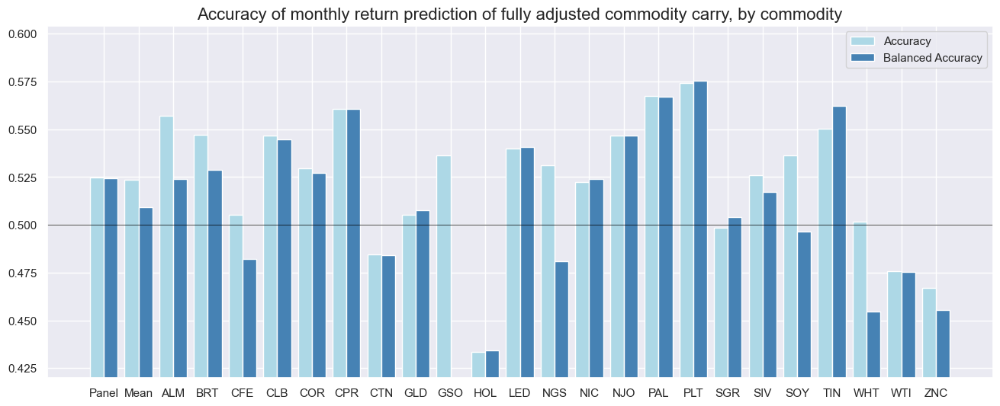

In [63]:

srr.accuracy_bars(
    type="cross_section",
    title="Accuracy of monthly return prediction of fully adjusted commodity carry, by commodity",
    size=(16, 6),
)

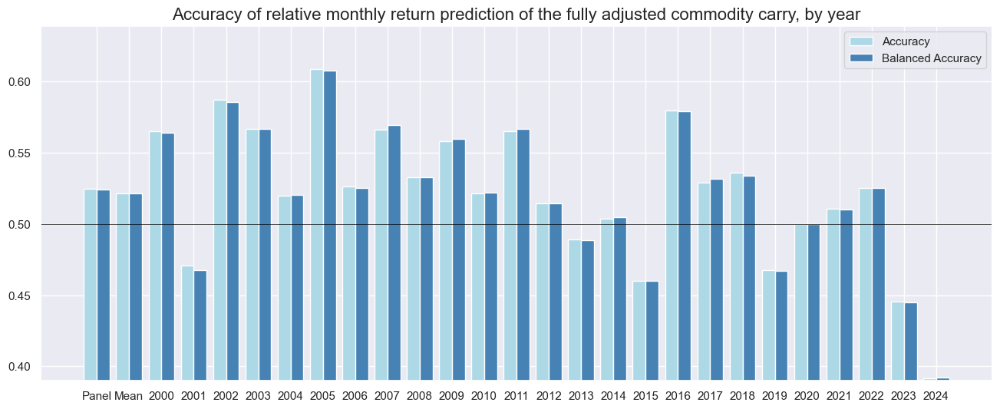

In [64]:

srr.accuracy_bars(
    type="years",
    title="Accuracy of relative monthly return prediction of the fully adjusted commodity carry, by year",
    size=(16, 6),
)

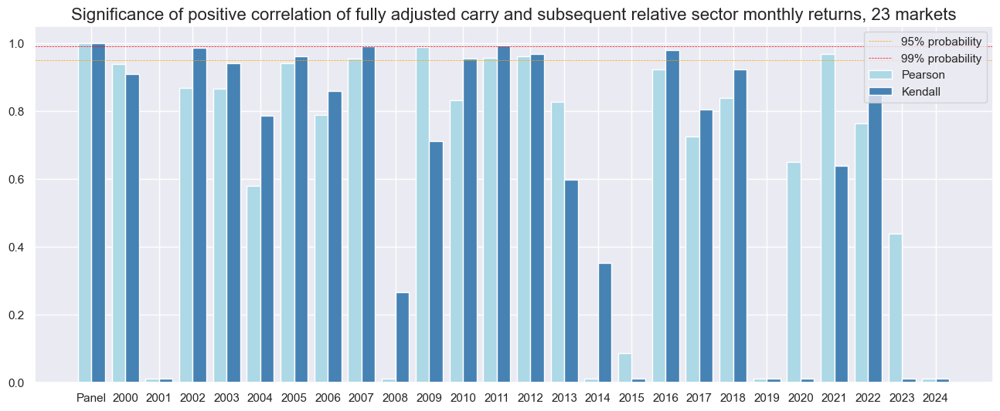

In [65]:

srr.correlation_bars(
    type="years",
    title="Significance of positive correlation of fully adjusted carry and subsequent relative sector monthly returns, 23 markets",
    size=(16, 6),
)

#### Naive PnL

As with directional strategy the custom class [`NaivePnL`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#naivepnl) is used to construct naive PnL. Upon instantiation, we define the list of relative carry as potential signals, target variable (`COXR_VT10vRCO`), list of cross-sections (all available in our case), and (optionally) benchmark (we choose here `USD_EQXR_NSA`, USD equity index futures returns and  `GLB_DRBXR_NSA` - Directional risk basket returns)

In [66]:
dix = dict_reg

targ = dix["targ"]
cidx = dix["cidx"]

pnl_relgroup = msn.NaivePnL(
    dfx,
    ret=targ,
    sigs=sigs,
    cids=cidx,
    start="2000-01-01",
    bms=["USD_EQXR_NSA", "GLB_DRBXR_NSA"],
)

for sig in sigs:
    pnl_relgroup.make_pnl(
        sig,
        sig_neg=False,
        sig_op="zn_score_pan",
        thresh=2,
        rebal_freq="monthly",
        vol_scale=10,
        rebal_slip=1,
        pnl_name=sig + "_PZN",
    )
    
dix["pnls"] = pnl_relgroup

In [67]:
dict_pns = {
    "COCRR_SAVT10_ZNIvRCO_PZN": "Fully adjusted carry",
    "COCRR_SAVT10vRCO_PZN": "Seasonally-adjusted and vol-targeted real carry",
    
    "COCRR_VT10_ZNIvRCO_PZN": "Vol-targeted, normalized and winsorized real carry",
    "COCRR_VT10vRCO_PZN": "Vol-targeted real carry",
}

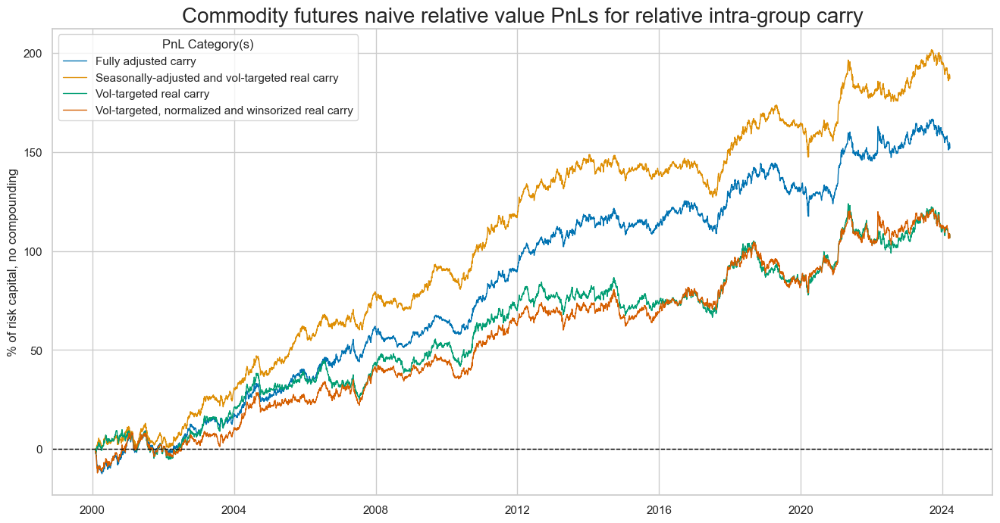

In [68]:
dix = dict_reg

start = dix["start"]
cidx = dix["cidx"]
pnl = dix["pnls"]

naive_pnl_relgroup = dix["pnls"]

pnls = [s + "_PZN" for s in sigs] 
pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    title="Commodity futures naive relative value PnLs for relative intra-group carry",
    figsize=(16, 8),
    xcat_labels=[dict_pns[k] for k in pnls],
)

The evaluate_pnls() method facilitates the presentation of key performance metrics for signals and, if required, the long-only Profit and Loss (PnL). When invoked, this method generates a concise dataframe containing essential PnL statistics. For further details, you can refer to the documentation for [`evaluate_pnls()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php?highlight=evaluate#evaluate-pnls)

In [69]:
dix = dict_reg

pnl = dix["pnls"]
pnls = [sig + type for sig in sigs for type in ["_PZN"]]

df_eval = pnl.evaluate_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start="2000-01-01",
)


In [70]:
display(df_eval.transpose().astype("float").round(3))

,Return (pct ar),St. Dev. (pct ar),Sharpe Ratio,Sortino Ratio,Max 21-day draw,Max 6-month draw,USD_EQXR_NSA correl,GLB_DRBXR_NSA correl,Traded Months
xcat,,,,,,,,,
COCRR_SAVT10_ZNIvRCO_PZN,6.300,10.0,0.630,0.932,-14.145,-15.604,0.014,0.048,291.0
COCRR_SAVT10vRCO_PZN,7.759,10.0,0.776,1.129,-13.519,-16.895,0.047,0.094,291.0
COCRR_VT10_ZNIvRCO_PZN,4.422,10.0,0.442,0.649,-11.403,-14.722,0.008,0.040,291.0
COCRR_VT10vRCO_PZN,4.424,10.0,0.442,0.632,-10.420,-16.573,0.045,0.083,291.0
